In [2]:
# Unos potrebnih biblioteka i modula

import skimage as ski
from skimage import io
import numpy as np
from scipy import ndimage as ndi
from matplotlib import pyplot as plt
from skimage.transform import hough_circle, hough_circle_peaks
from scipy.ndimage import label
from skimage.draw import circle_perimeter
import math

## 1) Implementacija funkcije za detekciju ivica pomoću Canny algoritma

In [2]:
# Funkcija koja određuje gradijente, magnitudu i ugao gradijenta
def sobel_gradient(image):
    Hx = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    # transponovanje matrice
    Hy = np.transpose(Hx)
    
    # izracunavanje vertikalnog i horizontalnog gradijenta slike
    Gx = ndi.correlate(image, Hx, mode='nearest')
    Gy = ndi.correlate(image, Hy, mode='nearest')
    
    # magnituda gradijenta
    mag = np.sqrt(np.square(Gx) + np.square(Gy))
    # ugao gradijenta u opsegu od -pi do pi
    angle = np.rad2deg(np.arctan2(Gy, Gx))
    return (Gx, Gy, mag, angle)


In [3]:
def canny_edge_detection(img_in, sigma, thr_low, thr_high):
    '''
    Opis funkcije: 
        Funkcija detektuje ivice slike pomoću Canny algoritma
        
    Ulazni parametri:
        img_in – Ulazna slika.
        sigma  – Standardna devijacija Gausove funkcije. Radijus prozora Gausovog filtra se određuje kao 3·sigma.
        thr_low – Apsolutna vrednost nižeg praga za histerezisno poređenje.
        thr_high – Apsolutna vrednost višeg praga za histerezisno poređenje.
        
    Izlazni parametri:
        edges – Mapa detektovanih ivica. Na pozicijama gde su detektovani ivični
        pikseli ima vrednost 1 dok na ostalim pozicijama ima vrednost 0.

    Reference:
        https://www.imageprocessingplace.com/downloads_V3/root_downloads/tutorials/contour_tracing_Abeer_George_Ghuneim/connect.html
        https://numpy.org/doc/2.1/reference/generated/numpy.logical_and.html
        Rafael C. Gonzalez and Richard E. Woods’ Digital Image Processing, Fourth Edition, Global Edition (pages: 729-733)
        
    '''
    


    
    img_gauss = ski.filters.gaussian(img_in, sigma, truncate=3, mode='nearest')    # filtritanje ulazne slike img_in pomocu gausovog filtra radijusa (radius = truncate*sigma)
    
    (Gx_g, Gy_g, mag_g, angle_g) = sobel_gradient(img_gauss)   # odredjivanje ugla i magnitude gradijenta preko sobel_gradient fje

    # Kvantizacija gradijenata na jedan od 4 pravca
    
    angle_g_quantized = np.zeros(angle_g.shape)
    angle_g_quantized[np.where(np.logical_and(angle_g > -22.5, angle_g <= 22.5))]=0
    angle_g_quantized[np.where(np.logical_and(angle_g <= -157.5, angle_g > 157.5))]=0
    
    angle_g_quantized[np.where(np.logical_and(angle_g > 22.5, angle_g <= 67.5))]=45
    angle_g_quantized[np.where(np.logical_and(angle_g <=-112.5, angle_g  > -157.5))]=45
    
    angle_g_quantized[np.where(np.logical_and(angle_g > 67.5, angle_g <= 112.5))]=90
    angle_g_quantized[np.where(np.logical_and(angle_g >  -112.5, angle_g <= -67.5))]=90
    
    angle_g_quantized[np.where(np.logical_and(angle_g > 112.5, angle_g <= 157.5))]=-45
    angle_g_quantized[np.where(np.logical_and(angle_g > -67.5, angle_g <= -22.5))]=-45
    
    

    # Potiskivanje vrednosti gradijenta koje ne predstavljaju lokalne maksimume
    [Ny,Nx] = np.shape(mag_g)
    mag_g_padded = np.pad(mag_g, 1, mode='constant',constant_values=0)  # prosirivanje matrice magnitude gradijenata zbog piksela na rubovima
    mag_g_output = np.zeros(mag_g.shape)
    for i in range(1,Ny+1):
        for j in range(1,Nx+1):
            if (angle_g_quantized[i-1,j-1] == 0 and max(mag_g_padded[i-1,j],mag_g_padded[i+1,j], mag_g_padded[i,j])==mag_g_padded[i,j]):
                mag_g_output[i-1,j-1]= mag_g_padded[i,j]

            if (angle_g_quantized[i-1,j-1] == 90 and max(mag_g_padded[i,j-1],mag_g_padded[i,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
                mag_g_output[i-1,j-1]= mag_g_padded[i,j]
            
            if (angle_g_quantized[i-1,j-1] == 45 and max(mag_g_padded[i-1,j-1],mag_g_padded[i+1,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
                mag_g_output[i-1,j-1]= mag_g_padded[i,j]
            
            if (angle_g_quantized[i-1,j-1] == -45 and max(mag_g_padded[i+1,j-1],mag_g_padded[i-1,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
                mag_g_output[i-1,j-1]= mag_g_padded[i,j]

        
    # Odredjivanje mapa slabih i jakih ivica
    
     
    mag_g_output_h = mag_g_output>thr_high # jake ivice

    mag_g_output_l =  ((mag_g_output<=thr_high) &  (mag_g_output>thr_low))   # slabe ivice

    # Mape jakih i slabih ivica su matrice u kojima su Boolean vrednosti
    

    mag_g_output_l_pad=np.pad(mag_g_output_l, 1, mode='constant', constant_values=0)  # proširujemo matricu slabih ivica zbog problema sa pordjenjem rubnih piksela 
    for i in range(0, Ny):  
        for j in range(0, Nx):
           
            if mag_g_output_h[i, j] == True:
                # Proveravamo susedstvo (takozvan 8-connectivity)
                for dx in [-1, 0, 1]:
                    for dy in [-1,0, 1]:
                        if mag_g_output_l_pad[i + dx + 1, j + dy + 1] != False:
                            # Odgovarajući piksel u mapi jakih ivica postavljamo na 1
                            mag_g_output_h[i + dx, j + dy] = 1
                            break

    edges=mag_g_output_h
    
    
    return edges
    
   
            
            

        



                    

In [4]:
# učitavanje ulazne slike lena.tif pri čemu su vrednosti intenziteta piksela u opsegu [0,1]
img=ski.util.img_as_float(ski.io.imread('image_sequences/lena.tif'))  

### Opisivanje koraka navedenih u zadatku 1) i prikaz medjurezultata

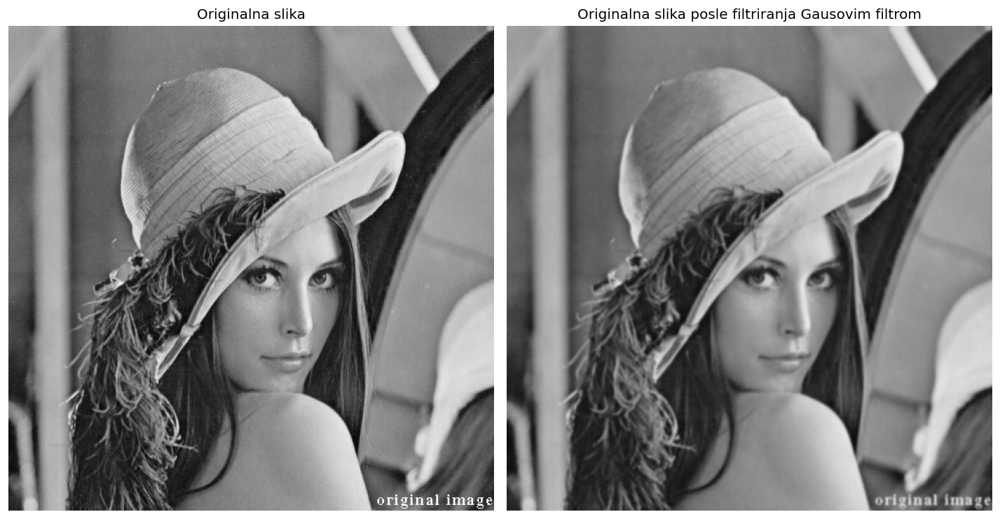

In [5]:
# Filtriranje ulazne slike Gausovom funkcijom zadate standardne devijacije
img_gauss =ski.filters.gaussian(img, 1, truncate=3, mode='nearest')


figure, ax=plt.subplots(nrows=1, ncols=2, figsize=(12,24), dpi=120)
for plot in ax:
    plot.axis('off')
#plotovanje poredjenja originalne i blurovane slike i njihovih ivica
ax[0].imshow(img,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Originalna slika')
ax[1].imshow(img_gauss, cmap='gray', vmin=0, vmax=1), ax[1].set_title('Originalna slika posle filtriranja Gausovim filtrom')


plt.tight_layout()

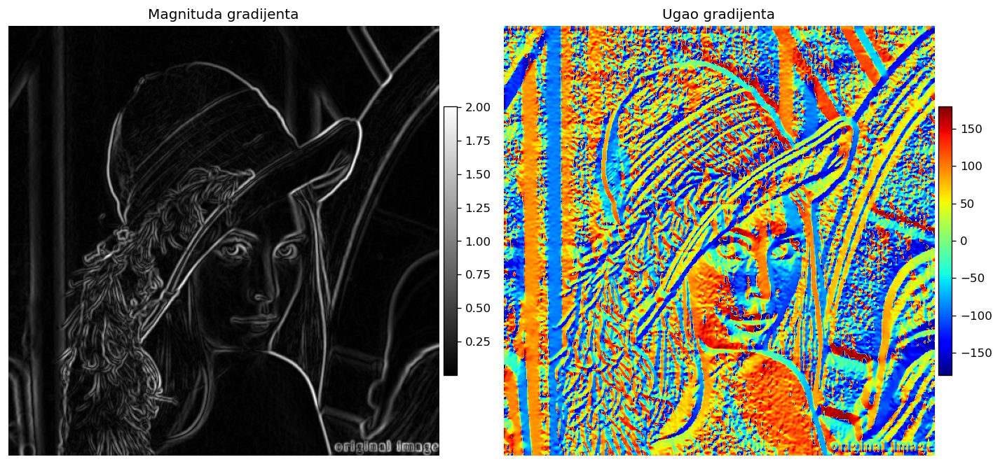

In [6]:
# Sada odredjujemo horizontalne i vertikalne gradijente filtriranje slike
# Koristimo Sobelov operator za izdvajanje gradijenata
#  Odredjujemo magnitudu i ugao gradijenta preko ranije definisane funkcije sobel_gradient


(Gx_g, Gy_g, mag_g, angle_g) = sobel_gradient(img_gauss) 

# Prikazivanje magnitude i ugla gradijenta
 
figure, ax=plt.subplots(nrows=1, ncols=2, figsize=(12,24), dpi=120)
for plot in ax:
    plot.axis('off')

ax[0].imshow(mag_g,     cmap='gray'), ax[0].set_title('Magnituda gradijenta')
ax[1].imshow(angle_g, cmap='jet'), ax[1].set_title('Ugao gradijenta')
plt.tight_layout()

im0 = ax[0].imshow(mag_g,     cmap='gray')
im1 = ax[1].imshow(angle_g, cmap='jet')
figure.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.01)
figure.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.01)

plt.tight_layout()

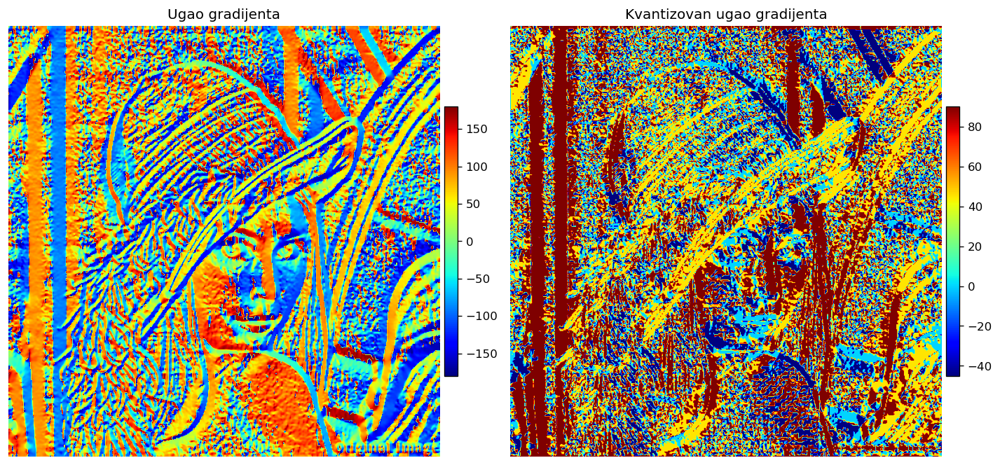

In [7]:
# Kvantizacija ugla gradijenta na jedan od 4 pravaca -45 deg, 0 deg, 45 deg, 90 deg.

(Gx_g, Gy_g, mag_g, angle_g) = sobel_gradient(img_gauss)   

# Kvantizacija gradijenata na jedan od 4 pravca

angle_g_quantized = np.zeros(angle_g.shape)
angle_g_quantized[np.where(np.logical_and(angle_g > -22.5, angle_g <= 22.5))]=0
angle_g_quantized[np.where(np.logical_and(angle_g <= -157.5, angle_g > 157.5))]=0

angle_g_quantized[np.where(np.logical_and(angle_g > 22.5, angle_g <= 67.5))]=45
angle_g_quantized[np.where(np.logical_and(angle_g <=-112.5, angle_g  > -157.5))]=45

angle_g_quantized[np.where(np.logical_and(angle_g > 67.5, angle_g <= 112.5))]=90
angle_g_quantized[np.where(np.logical_and(angle_g >  -112.5, angle_g <= -67.5))]=90

angle_g_quantized[np.where(np.logical_and(angle_g > 112.5, angle_g <= 157.5))]=-45
angle_g_quantized[np.where(np.logical_and(angle_g > -67.5, angle_g <= -22.5))]=-45

# Uporedni prikaz ugla gradijenta i kvantizovanog ugla gradijenta

figure, ax=plt.subplots(nrows=1, ncols=2, figsize=(12,24), dpi=120)
for plot in ax:
    plot.axis('off')

im0 = ax[0].imshow(angle_g,     cmap='jet')
ax[0].set_title('Ugao gradijenta')
im1 = ax[1].imshow(angle_g_quantized, cmap='jet')
ax[1].set_title('Kvantizovan ugao gradijenta')
figure.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.01)
figure.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.01)

plt.tight_layout()



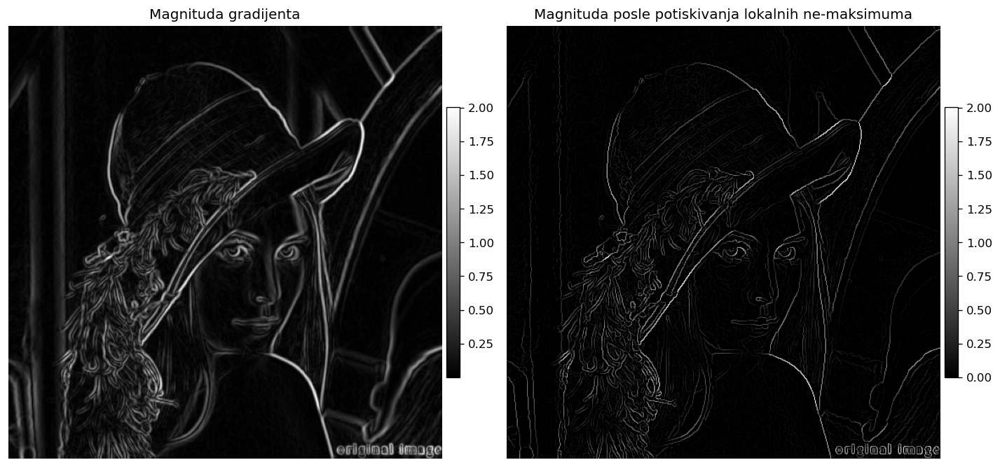

In [8]:
# Potiskivanje vrednosti gradijenata koje ne predstavljaju lokalne maksimume

(Gx_g, Gy_g, mag_g, angle_g) = sobel_gradient(img_gauss)

[Ny,Nx] = np.shape(mag_g)
mag_g_padded = np.pad(mag_g, 1, mode='constant',constant_values=0)  # prosirivanje matrice magnitude gradijenata zbog piksela na rubovima
mag_g_output = np.zeros(mag_g.shape)
for i in range(1,Ny+1):
    for j in range(1,Nx+1):
        if (angle_g_quantized[i-1,j-1] == 0 and max(mag_g_padded[i-1,j],mag_g_padded[i+1,j], mag_g_padded[i,j])==mag_g_padded[i,j]):
            mag_g_output[i-1,j-1]= mag_g_padded[i,j]

        if (angle_g_quantized[i-1,j-1] == 90 and max(mag_g_padded[i,j-1],mag_g_padded[i,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
            mag_g_output[i-1,j-1]= mag_g_padded[i,j]
        
        if (angle_g_quantized[i-1,j-1] == 45 and max(mag_g_padded[i-1,j-1],mag_g_padded[i+1,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
            mag_g_output[i-1,j-1]= mag_g_padded[i,j]
        
        if (angle_g_quantized[i-1,j-1] == -45 and max(mag_g_padded[i+1,j-1],mag_g_padded[i-1,j+1], mag_g_padded[i,j])==mag_g_padded[i,j]):
            mag_g_output[i-1,j-1]= mag_g_padded[i,j]

figure, ax=plt.subplots(nrows=1, ncols=2, figsize=(12,24), dpi=120)
for plot in ax:
    plot.axis('off')

ax[0].imshow(mag_g,     cmap='gray'), ax[0].set_title('Magnituda gradijenta')
ax[1].imshow(mag_g_output, cmap='gray'), ax[1].set_title('Magnituda posle potiskivanja lokalnih ne-maksimuma')
plt.tight_layout()

im0 = ax[0].imshow(mag_g,     cmap='gray')
im1 = ax[1].imshow(mag_g_output, cmap='gray')
figure.colorbar(im0, ax=ax[0], fraction=0.03, pad=0.01)
figure.colorbar(im1, ax=ax[1], fraction=0.03, pad=0.01)

plt.tight_layout()




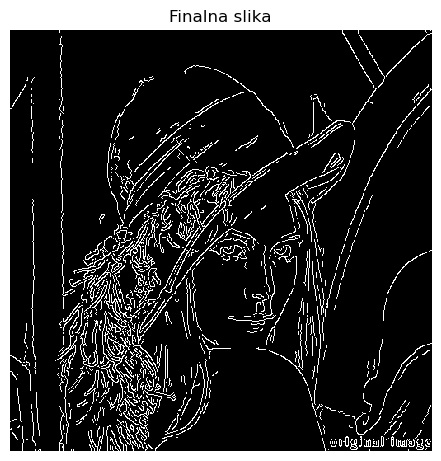

In [9]:
# Sada radimo histerezisno poredjenje sa pragom i tako dobijamo mape jakih i slabih ivica 
# Nakon histerezisnog poredjenja sa pragom radimo uključivanje u izlaznu mapu ivica onih slabih ivica koje su povezane sa nekom jakom ivicom


# Na osnovu vrednosti magnitude posle potiskivanja lokalnih ne-maksimuma biramo thr_high = 0.25, a thr_low = 0.1


thr_high = 0.25
thr_low = 0.1

mag_g_output_h = mag_g_output>thr_high # jake ivice

mag_g_output_l =  ((mag_g_output<=thr_high) &  (mag_g_output>thr_low))   # slabe ivice

# Mape jakih i slabih ivica su matrice u kojima su Boolean vrednosti


mag_g_output_l_pad=np.pad(mag_g_output_l, 1, mode='constant', constant_values=0)  # proširujemo matricu slabih ivica zbog problema sa pordjenjem rubnih piksela 
for i in range(0, Ny):  
    for j in range(0, Nx):
       
        if mag_g_output_h[i, j] == True:
            # Proveravamo susedstvo (takozvan 8-connectivity)
            for dx in [-1, 0, 1]:
                for dy in [-1,0, 1]:
                    if mag_g_output_l_pad[i + dx + 1, j + dy + 1] != False:
                        # Odgovarajući piksel u mapi jakih ivica postavljamo na 1
                        mag_g_output_h[i + dx, j + dy] = 1
                        break

edges=mag_g_output_h


ski.io.imshow(edges, cmap='grey')
plt.title('Finalna slika')
plt.axis('off')
plt.show()







### Testiranje funkcije `canny_edge_detection(img_in, sigma, thr_low, thr_high)` nad ostalim slikama

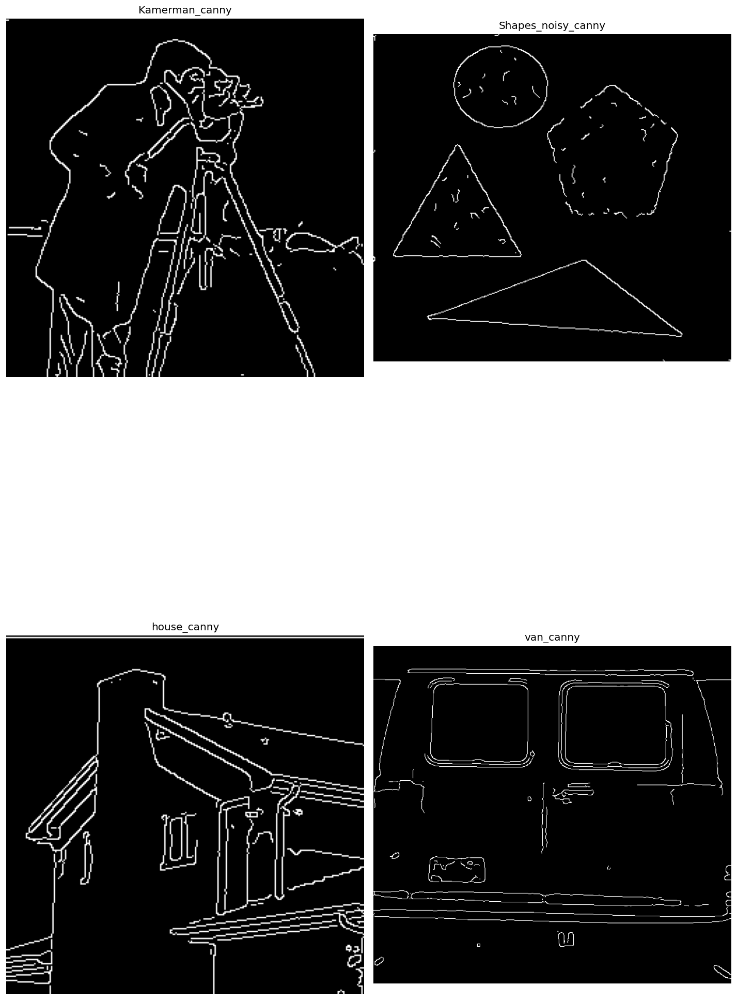

In [10]:
# Učitavanje ulaznih slika pri čemu su vrednosti intenziteta piksela u opsegu [0,1]
camerman=ski.util.img_as_float(ski.io.imread('image_sequences/camerman.tif'))  
shapes_noisy=ski.util.img_as_float(ski.io.imread('image_sequences/shapes_noisy.tif'))  
house=ski.util.img_as_float(ski.io.imread('image_sequences/house.tif'))  
van=ski.util.img_as_float(ski.io.imread('image_sequences/van.tif'))  




camerman_canny = canny_edge_detection(camerman,2,0.1,0.25)
shapes_noisy_canny = canny_edge_detection(shapes_noisy,2,0.1,0.25)
house_canny = canny_edge_detection(house,1,0.1,0.25)
van_canny = canny_edge_detection(van,1.8,0.1,0.25)



figure, ax=plt.subplots(nrows=2, ncols=2, figsize=(12,24), dpi=120)
for plot in ax.flatten():
    plot.axis('off')


ax[0,0].imshow(camerman_canny, cmap='gray'), ax[0,0].set_title('Kamerman_canny')
ax[0,1].imshow(shapes_noisy_canny, cmap='gray'), ax[0,1].set_title('Shapes_noisy_canny')
ax[1,0].imshow(house_canny, cmap='gray'), ax[1,0].set_title('house_canny')
ax[1,1].imshow(van_canny, cmap='gray'), ax[1,1].set_title('van_canny')
plt.tight_layout()

### Testiranje canny_edge_detection funkcije za različite vrednosti ulaznih parametara
Povećanjem vrednosti nižeg praga (thr_low) i višeg praga (thr_high) vidimo da ostaju samo jake ivice, slabe ivice i detalji na slikama se gube. Takođe vidimo da se na slici shapes_noisy izgubio geometrijski oblik petougla. To je posledica povećanja nižeg praga i višeg praga. <br />Smanjenjem vrednosti nižeg praga (thr_low) i višeg praga (thr_high) vidimo da se znatno povećao broj detektovanih ivica na slikama, takođe vidimo da je šum na slikama camerman i shapes_noisy detektovan kao ivica. Međutim za razliku od slučaja kada povećavamo ili smanjujemo sigma, jasno uočavamo 'glavne' ivice što se vidi na slici shapes_noisy. <br />
Smanjenjem standardne devijacije Gausovog filtra vidimo da na zašumljenim slikama camerman i shapes_noisy šum postaje detektovan kao ivica. Na slikama house i van takodje dobijamo ivice na delovima gde se nalaze artefakti. <br />
Povećanjem standardne devijacije sigma = 3, rešavamo problem šuma koji je detektovan kao deo ivice, ali neke ivice zato bivaju izgubljene. Takodje na slici shapes_noisy stranice petougla nisu detektovane. 

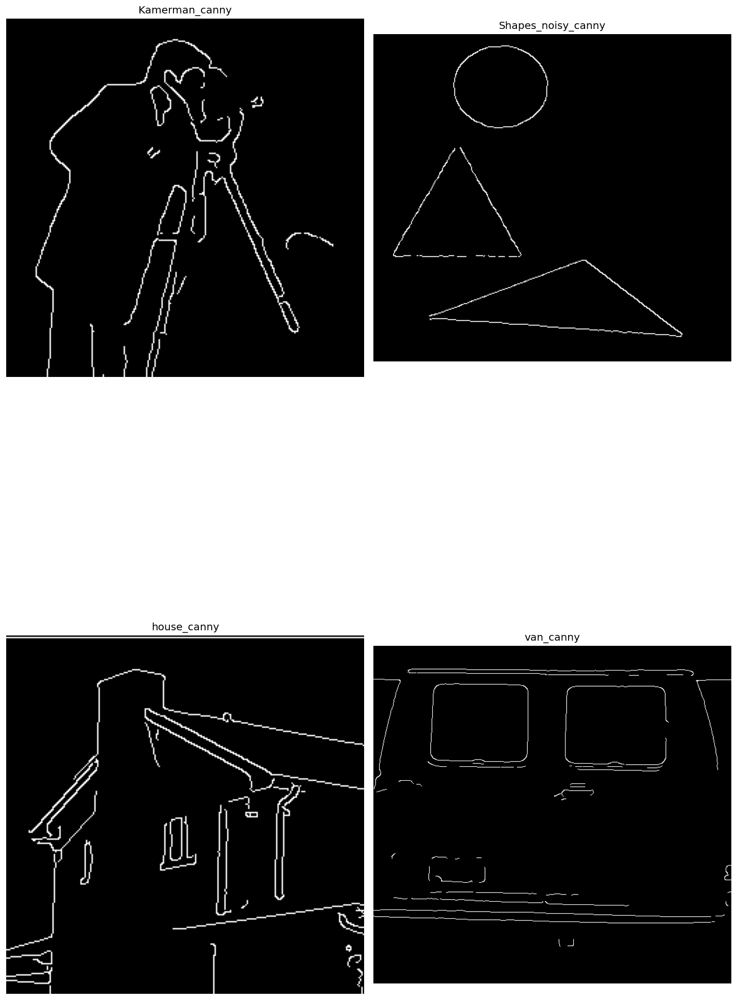

In [11]:
# Povećanje vrednosti nižeg praga (thr_low) i višeg praga (thr_high)
camerman_canny = canny_edge_detection(camerman,2,0.3,0.6)
shapes_noisy_canny = canny_edge_detection(shapes_noisy,2,0.3,0.6)
house_canny = canny_edge_detection(house,1,0.3,0.6)
van_canny = canny_edge_detection(van,1.8,0.3,0.6)



figure, ax=plt.subplots(nrows=2, ncols=2, figsize=(12,24), dpi=120)
for plot in ax.flatten():
    plot.axis('off')


ax[0,0].imshow(camerman_canny, cmap='gray'), ax[0,0].set_title('Kamerman_canny')
ax[0,1].imshow(shapes_noisy_canny, cmap='gray'), ax[0,1].set_title('Shapes_noisy_canny')
ax[1,0].imshow(house_canny, cmap='gray'), ax[1,0].set_title('house_canny')
ax[1,1].imshow(van_canny, cmap='gray'), ax[1,1].set_title('van_canny')
plt.tight_layout()

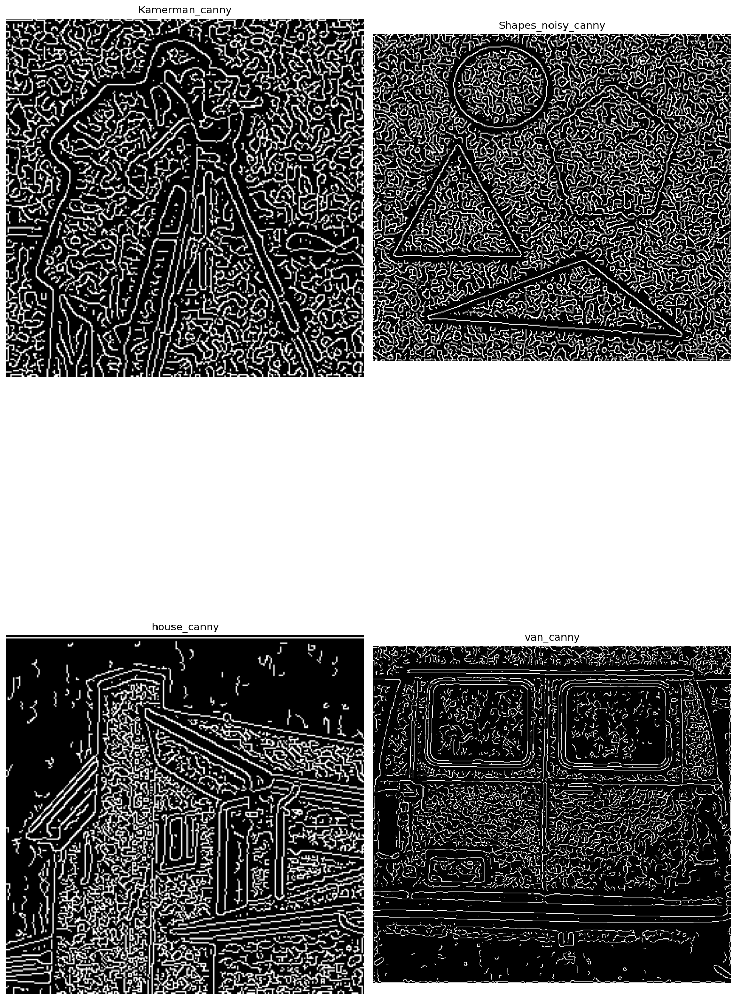

In [12]:
# Smanjenje vrednosti nižeg praga (thr_low) i višeg praga (thr_high) 
camerman_canny = canny_edge_detection(camerman,2,0.01,0.025)
shapes_noisy_canny = canny_edge_detection(shapes_noisy,2,0.01,0.025)
house_canny = canny_edge_detection(house,1,0.01,0.025)
van_canny = canny_edge_detection(van,1.8,0.01,0.025)



figure, ax=plt.subplots(nrows=2, ncols=2, figsize=(12,24), dpi=120)
for plot in ax.flatten():
    plot.axis('off')


ax[0,0].imshow(camerman_canny, cmap='gray'), ax[0,0].set_title('Kamerman_canny')
ax[0,1].imshow(shapes_noisy_canny, cmap='gray'), ax[0,1].set_title('Shapes_noisy_canny')
ax[1,0].imshow(house_canny, cmap='gray'), ax[1,0].set_title('house_canny')
ax[1,1].imshow(van_canny, cmap='gray'), ax[1,1].set_title('van_canny')
plt.tight_layout()

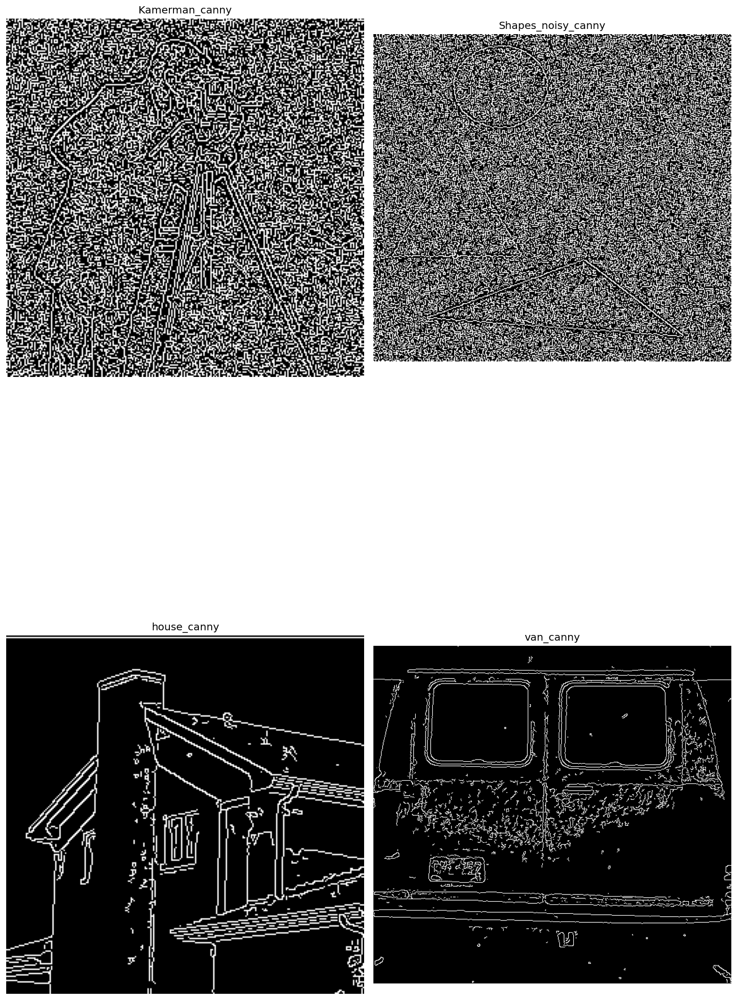

In [13]:
#Smanjenje standardne devijacije Gausovog filtra
camerman_canny = canny_edge_detection(camerman,0.5,0.1,0.25)
shapes_noisy_canny = canny_edge_detection(shapes_noisy,0.5,0.1,0.25)
house_canny = canny_edge_detection(house,0.5,0.1,0.25)
van_canny = canny_edge_detection(van,0.5,0.1,0.25)



figure, ax=plt.subplots(nrows=2, ncols=2, figsize=(12,24), dpi=120)
for plot in ax.flatten():
    plot.axis('off')


ax[0,0].imshow(camerman_canny, cmap='gray'), ax[0,0].set_title('Kamerman_canny')
ax[0,1].imshow(shapes_noisy_canny, cmap='gray'), ax[0,1].set_title('Shapes_noisy_canny')
ax[1,0].imshow(house_canny, cmap='gray'), ax[1,0].set_title('house_canny')
ax[1,1].imshow(van_canny, cmap='gray'), ax[1,1].set_title('van_canny')
plt.tight_layout()

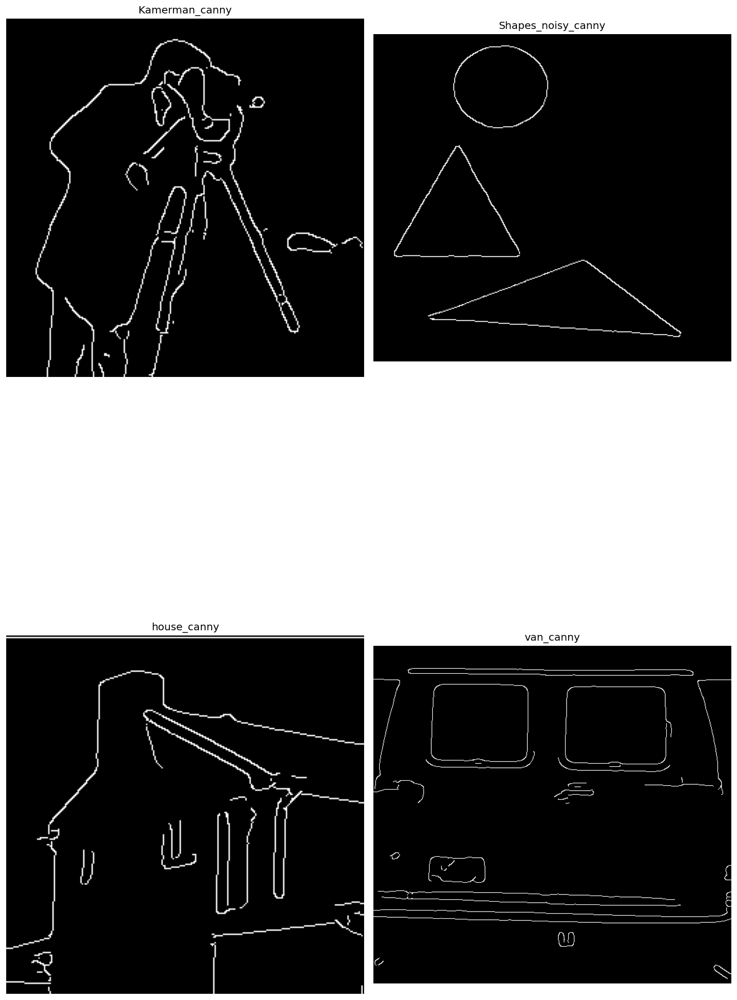

In [14]:
#Povećanje standardne devijacije sigma = 3
camerman_canny = canny_edge_detection(camerman,3,0.1,0.25)
shapes_noisy_canny = canny_edge_detection(shapes_noisy,3,0.1,0.25)
house_canny = canny_edge_detection(house,3,0.1,0.25)
van_canny = canny_edge_detection(van,3,0.1,0.25)



figure, ax=plt.subplots(nrows=2, ncols=2, figsize=(12,24), dpi=120)
for plot in ax.flatten():
    plot.axis('off')


ax[0,0].imshow(camerman_canny, cmap='gray'), ax[0,0].set_title('Kamerman_canny')
ax[0,1].imshow(shapes_noisy_canny, cmap='gray'), ax[0,1].set_title('Shapes_noisy_canny')
ax[1,0].imshow(house_canny, cmap='gray'), ax[1,0].set_title('house_canny')
ax[1,1].imshow(van_canny, cmap='gray'), ax[1,1].set_title('van_canny')
plt.tight_layout()

## 2) Implementacija funkcije `get_line_segments`

Koristeći funkciju `probabilistic_hough_line` koja ima tri parametra threshold, line_length, line_gap i vraća početne i krajnje tačke svakog od detektovanih segmenata na osnovu prethodno navedenih ulaznih parametara. Prvo ćemo zadate parametre pravca linije predstaviti u Dekartovom koordinatnom sistemu.
Na osnovu jednačine zadate prave: ${ρ=x*cos(θ)+y*sin(θ)}$  i jednačine za rastojanje tačke od prave $ \frac {|a*x0+b*y0+c|}{\sqrt{b^2+a^2}}$  možemo da izračunamo rastojanja početne i krajnje tačke od zadatog pravca sa ρ i θ. Ako su rastojanja u opsegu tolerancije zadate sa parametrom tolerancy segment postaje validan.  

In [30]:
# Implementacija get_line_segments pomocu probabilistic hough-line transform-a


import numpy as np
from skimage.transform import probabilistic_hough_line
from skimage import io, color, feature


def get_line_segments(img_edges, line, min_length, max_gap, tolerancy):
    
    """
        Opis funkcije:
        
        Funkcija get_line_segments koja na osnovu matrice izdvojenih ivica i pravca linije zadate u normalnoj reprezentaciji izdvaja 
        sve segmente zadate minimalne dužine koje se nalaze na datom pravcu.

        
        
        Ulazni parametri:
        
        img_edges (numpy.ndarray): Slika sa detektovanim ivičnim pikselima sa koje se detektuju linije
        line (tuple):  Niz od dva elementa (theta, rho) kojim se zadaje pravac
        min_length (int): Minimalna dužina segmenta da bi duž bila detektovana
        max_gap (int): Maksimalna dužina prekida koji se može ignorisati
        tolerancy (int): Radijus okoline u okviru koje se traže ivični pikseli
        
        Izlazni parametri:
        
        segments_num – Broj detektovanih segmenata.
        segments_size – Niz koji sadrži veličine detektovanih segmenata.
        segments_coord – Lista detektovanih koordinata detektovanih segmenata pri čemu je svaki segment predstavljen sa koordinatama početne i krajnje tačke.

        Reference:
           https://scikit-image.org/docs/stable/auto_examples/edges/plot_line_hough_transform.html#sphx-glr-auto-examples-edges-plot-line-hough-transform-py 





    
    """
    theta, rho = line
    a, b = np.cos(theta), np.sin(theta)  # Pretvaramo iz polarnog koordinatnog sistema u Dekartov
    

    # Koristimo probabilistic_hough_line iz skimage.transform biblioteke
    segments = probabilistic_hough_line(
        img_edges,
        threshold=25,          # Minimalan 'skor' na osnovu koga detektujemo ili ne detektujemo liniju
        line_length=min_length,
        line_gap=max_gap, rng=21
    )

    valid_segments = []
    for (x1, y1), (x2, y2) in segments:
        # Racunamo rastojanje svake od tacaka detektovanih segmenata od zadate prave(theta,rho)
        dist1 = abs(a * x1 + b * y1 - rho) / np.sqrt(a**2 + b**2)
        dist2 = abs(a * x2 + b * y2 - rho) / np.sqrt(a**2 + b**2)
        
        # Provera da li su rastojanja u opsegu tolerancije zadate sa prametrom tolerancy  
        if dist1 <= tolerancy and dist2 <= tolerancy:
            
            valid_segments.append(((x1, y1), (x2, y2)))
            # dodavanje segmenta na listu validnih segmenata valid_segments

        
    
    


    # Racunanje izlaznih parametara
    segments_num = len(valid_segments)
    segments_size = [int(np.sqrt((x2 - x1)**2 + (y2 - y1)**2)) for (x1, y1), (x2, y2) in valid_segments]
    segments_coord = [(x1, y1, x2, y2) for (x1, y1), (x2, y2) in valid_segments]
    
    return segments_num, segments_size, segments_coord

        




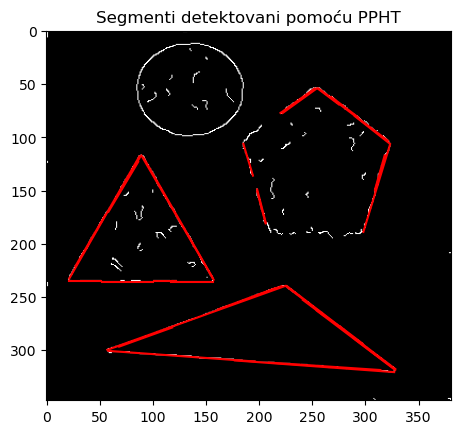

In [23]:
# Prikaz medjurezultata

image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)

segments = probabilistic_hough_line(
        img_edges,
        threshold=35,          # Minimalan 'skor' na osnovu koga detektujemo ili ne detektujemo liniju
        line_length=20,
        line_gap=10, rng=21
    )

fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for ((x0, y0), (x1, y1)) in segments:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Segmenti detektovani pomoću PPHT')
plt.show()


### Testiranje funkcije sa različitim vrednostima ulaznih parametara na slici shapes_noisy.tif 

Da bismo testirali funkciju `get_line_segments` moramo prvo da pomoću Hough-ove transformacije odredimo linije koje postoje na slici. Posle detekcije linija pomoću  `skimage.transform.hough_line` i `ski.transform.hough_line_peaks` uzimamo jedan set (theta,rho).
Parametre u `canny_edge_detection` su postavljeni na optimalnu vrednost i nisu menjani tokom testiranja `get_line_segments` funkcije. Smanjenjem parametra threshold u `probabilistic_hough_line` funkciji i povećanjem parametra max_gap vidimo da ivice na mestu ivica koje nisu očuvane zbog šuma i dalje možemo da detektujemo segmente. To se vidi u primerima 1 i 2. Sada povećavamo min_length i testiramo ga za prethodni pravac (primer 3) i novi pravac (primer 4). U primeru 3 stranica petougla vise nije detektovana, jer je duzina stranice manja od min_length, dok u primeru 4. vidimo da jeste detekotvana stranica trougla. U primeru 5. prikazan je uticaj parametra tolerancy ostali parametri su isti kao u primeru 2, samo je tolerancy postavljen na 0. Onda vidimo da nijedan segment nije detektovan zbog smanjena radijusa okoline u okviru koje se traže ivični pikseli.


Number of segments: 0
Segment sizes: []
Segment coordinates: []


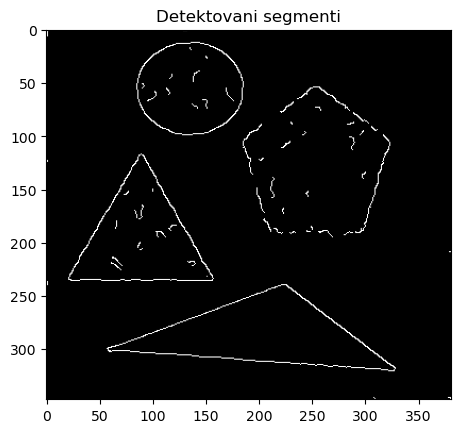

In [24]:
# Primer 1 - uticaj parametra max_gap
image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)


# Definisanje parametara
theta, rho = np.deg2rad(53.50), 193      


min_length = 50
max_gap = 10   
tolerancy = 1

# Testiranje funkcije
segments_num, segments_size, segments_coord = get_line_segments(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)



print(f"Number of segments: {segments_num}")
print(f"Segment sizes: {segments_size}")
print(f"Segment coordinates: {segments_coord}")
fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for (x0, y0, x1, y1) in segments_coord:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Detektovani segmenti')
plt.show()



Number of segments: 2
Segment sizes: [76, 78]
Segment coordinates: [(190, 99, 252, 54), (189, 100, 253, 54)]


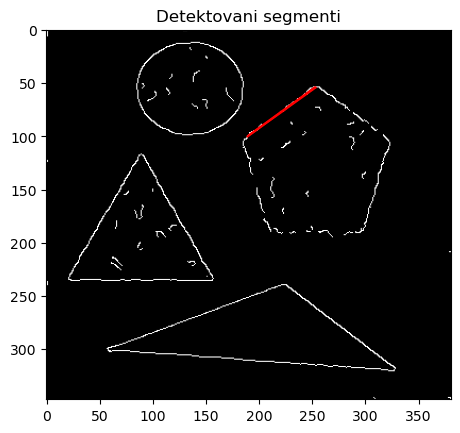

In [25]:
# Primer 2 - uticaj parametra max_gap
image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)


# Definisanje parametara
theta, rho = np.deg2rad(53.50), 193      


min_length = 50
max_gap = 20   
tolerancy = 1

# Testiranje funkcije
segments_num, segments_size, segments_coord = get_line_segments(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)



print(f"Number of segments: {segments_num}")
print(f"Segment sizes: {segments_size}")
print(f"Segment coordinates: {segments_coord}")
fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for (x0, y0, x1, y1) in segments_coord:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Detektovani segmenti')
plt.show()



Number of segments: 0
Segment sizes: []
Segment coordinates: []


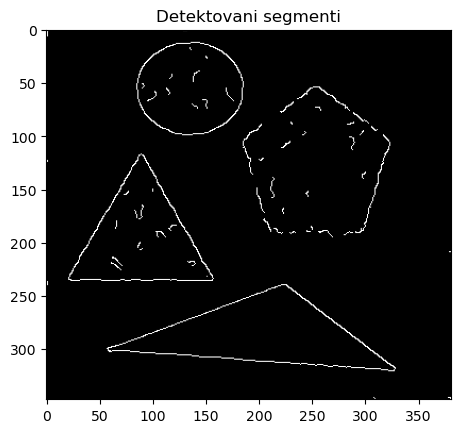

In [26]:
# Primer 3 - uticaj povećanja parametra min_length
image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)


# Definisanje parametara
theta, rho = np.deg2rad(53.50), 193      


min_length = 100
max_gap = 20   
tolerancy = 1

# Testiranje funkcije
segments_num, segments_size, segments_coord = get_line_segments(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)



print(f"Number of segments: {segments_num}")
print(f"Segment sizes: {segments_size}")
print(f"Segment coordinates: {segments_coord}")
fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for (x0, y0, x1, y1) in segments_coord:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Detektovani segmenti')
plt.show()



Number of segments: 1
Segment sizes: [176]
Segment coordinates: [(57, 300, 223, 240)]


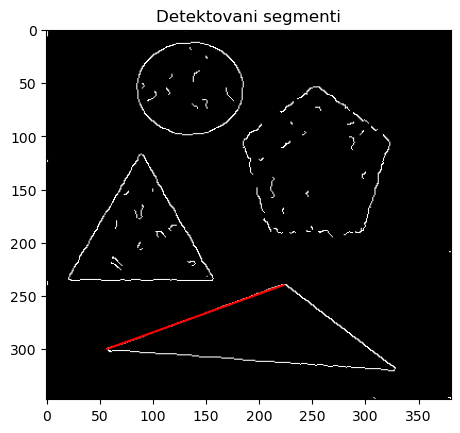

In [27]:
# Primer 4 - uticaj povećanja parametra min_length
image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)


# Definisanje parametara
theta, rho = np.deg2rad(69.67), 302


min_length = 100
max_gap = 10   
tolerancy = 1

# Testiranje funkcije
segments_num, segments_size, segments_coord = get_line_segments(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)



print(f"Number of segments: {segments_num}")
print(f"Segment sizes: {segments_size}")
print(f"Segment coordinates: {segments_coord}")
fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for (x0, y0, x1, y1) in segments_coord:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Detektovani segmenti')
plt.show()



Number of segments: 0
Segment sizes: []
Segment coordinates: []


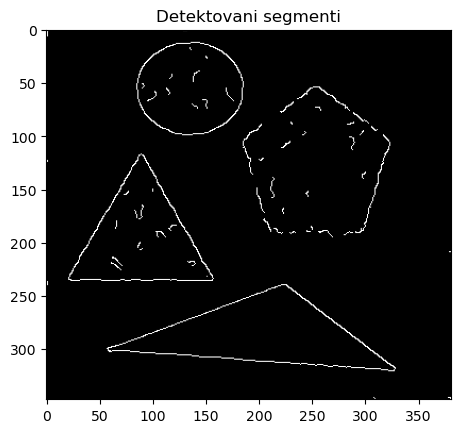

In [47]:
# Primer 5 - uticaj parametra tolerancy
image = ski.io.imread('image_sequences/shapes_noisy.tif')
image = ski.img_as_float(image)
img_edges = canny_edge_detection(image,2,0.1,0.25)


# Definisanje parametara
theta, rho = np.deg2rad(53.50), 193      


min_length = 50
max_gap = 20   
tolerancy = 0

# Testiranje funkcije
segments_num, segments_size, segments_coord = get_line_segments(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)



print(f"Number of segments: {segments_num}")
print(f"Segment sizes: {segments_size}")
print(f"Segment coordinates: {segments_coord}")
fig, ax = plt.subplots()
ax.imshow(img_edges, cmap=plt.cm.gray)
for (x0, y0, x1, y1) in segments_coord:
    ax.plot((x0, x1), (y0, y1), '-r')
ax.set_title('Detektovani segmenti')
plt.show()



Pronadjeno je 3 pikova
-85.83 -296.00
69.67 302.00
-52.33 -52.00


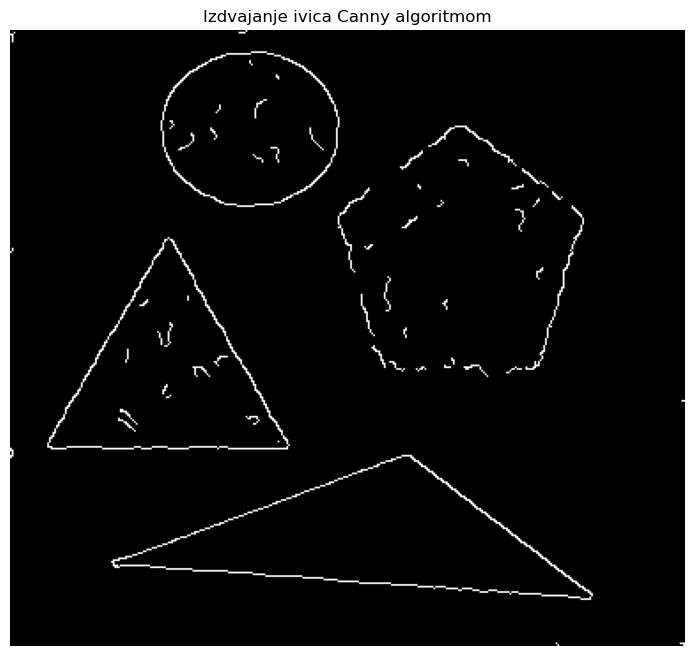

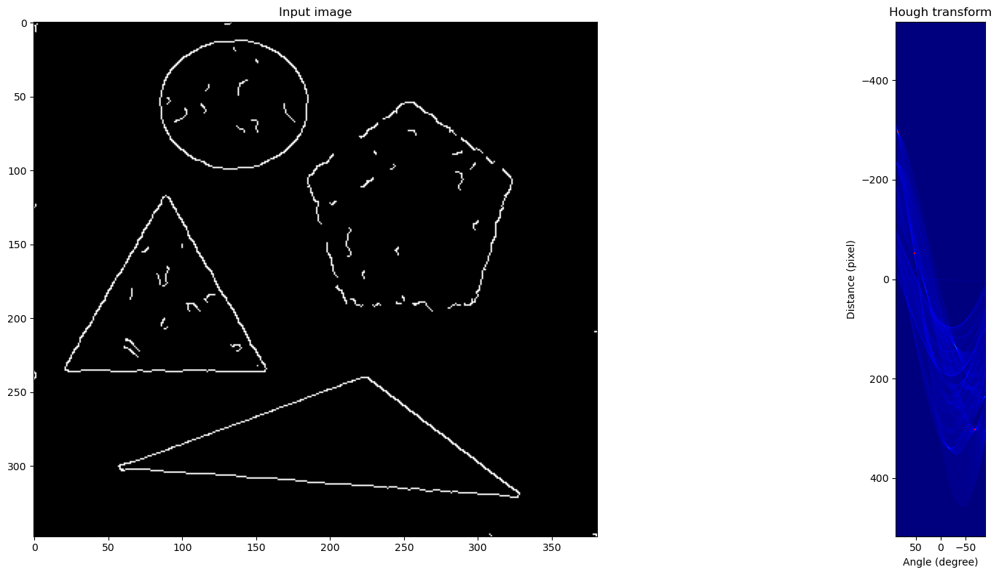

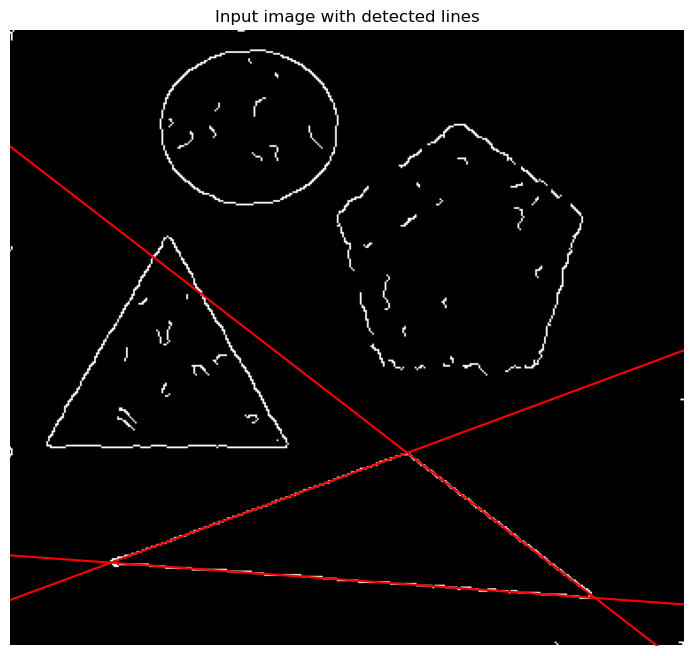

In [48]:


# Posmatranje linija na slici shapes_noisy
 





fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap='gray', vmin=0, vmax=1), axes.axis('off'), axes.set_title('Izdvajanje ivica Canny algoritmom')

tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(img_edges, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=45, num_peaks=3)   # The intensity is the total number of votes for a particular line (angle-distance combination)
# num_peaks=11 maksimalni broj pikova
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

print('Pronadjeno je '+str(np.shape(peak_angles)[0])+' pikova')
for angle, dist in zip(peak_angles, peak_distances):
    "%5.4x"% (47)
    print('%.2f %.2f'% (np.rad2deg(angle), dist))


axes[0].imshow(img_edges, cmap=plt.cm.gray)
axes[0].set_title('Input image')
axes[1].imshow(
    out, cmap=plt.cm.jet,
    extent=(np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]))     # extent xmax,xmin pa onda ymax,ymin
axes[1].set_title('Hough transform')
axes[1].set_xlabel('Angle (degree)')
axes[1].set_ylabel('Distance (pixel)')
axes[1].scatter(np.rad2deg(-peak_angles), peak_distances, s=2, c='r', marker='+')
plt.tight_layout()

# plot detected lines
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap=plt.cm.gray)
axes.set_title('Input image with detected lines')
origin = np.array((0, img_edges.shape[1]))
for _, angle, dist in zip(intensity, peak_angles, peak_distances):
    y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
    axes.plot(origin, (y0, y1), '-r')
axes.set_xlim(origin)
axes.set_ylim((img_edges.shape[0], 0))
axes.set_axis_off()


# NAPOMENA: Hough transformacija u Python-u nema opciju odredjivanja duzi na osnovu detektovanih pravih i izdvojenih ivica










## 3) Funkcija extract_time koja za ulaznu sliku vraća informaciju o vremenu

Ideja je da koristimo prethodno realizovane funkcije za detekciju ivica i duži kako bi se
odredila pozicija i orijentacija kazaljki sata. <br />Za detekciju kazaljki posmatraćemo samo središnji deo slike sata na kojoj su detektovane ivice pomoću Canny algoritma. <br /> Prvo ćemo da detektujemo dominantan krug i koordinate njegovog centra preko funkcije `get_circle_center`. <br />Onda ćemo da posmatramo samo središnji deo tako što ćemo na osnovu dimenzija slike iseći deo oko centra. <br />Onda ćemo koristeći `skimage.transform.hough_line` i `skimage.transform.hough_line_peaks` detektovati dve najznačajnije linije (na jednoj od njih je satna kazaljka, a druga na drugoj minutna). <br />Posle detekcije linija koristimo funkciju za detekciju segmenata `get_line_segments_clock` i pomoću nje ćemo pronaći segmente i sačuvati njihovu dužinu i ugao u odnosnu na vertikalnu osu u CCW smeru. <br /> Sa podacima o dužini možemo odrediti koja je kazaljka satna, a koja minutna, a na osnovu uglova detektovano vreme. <br />Posle definisanja potrebnih funkcija za glavnu extract_time funkciju prikazani su **medjurezultati** na primerima 2 sata. 

In [3]:
# Funkcija za detekciju kazaljki
# U funkciji get_line_segments može doći do detekcije više segmenata na jednom pravcu da bismo to izbegli, 
# modifikujemo funkciju get_line_segments i izdvadajmo samo najduži segment na detektovanom pravcu.

def get_line_segments_clock(img_edges, line, min_length, max_gap, tolerancy):
    
    """
        Opis funkcije:
        
        Funkcija get_line_segments_clock koja na osnovu matrice izdvojenih ivica i pravca linije zadate u normalnoj reprezentaciji izdvaja 
        najduži segment zadate minimalne dužine koji se nalazi na zadatom pravcu.

        
        
        Ulazni parametri:
        
        img_edges (numpy.ndarray): Slika sa detektovanim ivičnim pikselima sa koje se detektuju linije
        line (tuple):  Niz od dva elementa (theta, rho) kojim se zadaje pravac
        min_length (int): Minimalna dužina segmenta da bi duž bila detektovana
        max_gap (int): Maksimalna dužina prekida koji se može ignorisati
        tolerancy (int): Radijus okoline u okviru koje se traže ivični pikseli



        Izlazni parametri:
        
        longest_segment_size – Dužina najdužeg segmenta 
        (x1,y1,x2,y2) – Koordinate najdužeg segmenta 
    
    """
    theta, rho = line
    a, b = np.cos(theta), np.sin(theta) 
    x0, y0 = a * rho, b * rho          
    
    # Perform Probabilistic Hough Transform
    segments = probabilistic_hough_line(
        img_edges,
        threshold=25,          
        line_length=min_length,
        line_gap=max_gap,
        rng=21
    )

    valid_segments = []
    for (x1, y1), (x2, y2) in segments:
        
        dist1 = abs(a * x1 + b * y1 - rho) / np.sqrt(a**2 + b**2)
        dist2 = abs(a * x2 + b * y2 - rho) / np.sqrt(a**2 + b**2)
        
        if dist1 <= tolerancy and dist2 <= tolerancy:
            valid_segments.append(((x1, y1), (x2, y2)))

   
    # Traženje najdužeg segmenta
    longest_segment = max(valid_segments, key=lambda seg: np.sqrt((seg[1][0] - seg[0][0])**2 + (seg[1][1] - seg[0][1])**2)) # definisanje inline funkcije pomoću key=lambda
    (x1, y1), (x2, y2) = longest_segment
    longest_segment_size = int(np.sqrt((x2 - x1)**2 + (y2 - y1)**2))

    return (x1, y1, x2, y2), longest_segment_size








In [5]:
# Funkcija za detekciju najvećeg kruga i koordinati njegovog centra


def get_circle_center(edges):

    '''
        Reference: https://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.hough_circle
                   https://scikit-image.org/docs/stable/auto_examples/edges/plot_circular_elliptical_hough_transform.html
    '''
    
    hough_radii = np.arange(100, 650, 10)
    hough_res = hough_circle(edges, hough_radii)

   
    accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=1)
    
    return (cx,cy)    
    





    

In [7]:
# Definisanje funkcija za vektor, vektorski i skalarni proizvod 2 vektora

def get_vector(x1,y1,x2,y2):
    vector = [x2 - x1, y2 - y1]
    return vector


def dot_product(u, v):
    return u[0] * v[0] + u[1] * v[1]


def cross_product(u, v):
    return u[0] * v[1] - u[1] * v[0]


In [8]:
# Definisanje funkcije za rastojanje neke tačke od centra
def get_distance(x1,y1,center_x,center_y):
    return math.sqrt((center_x-x1)**2+(center_y-y1)**2)
        

In [9]:
def get_angle(x1,y1,x2,y2, center_x, center_y):
    # Vektor u je vektor kazaljke
    u = get_vector(x1,y1,x2,y2)

    # Pravimo vertikalni vektor koji kreće od centra, ide 'nagore' za 50 px po y osi
    v = [center_x - center_x, center_y - (center_y+50)]


    # Racunamo skalarni proizvod 2 vektora 
    dot_uv = dot_product(u, v)

    # Racunamo duzine vektora 
    length_u = math.sqrt(u[0]**2 + u[1]**2)
    length_v = math.sqrt(v[0]**2 + v[1]**2)

    # Racunanje kosinusa ugla izmedju vektora u i v
    cos_theta = dot_uv / (length_u * length_v)

    # Ograničenje kosinusa teta na opseg [-1,1]
    cos_theta = max(min(cos_theta, 1.0), -1.0)

    # Ugao teta
    theta = math.acos(cos_theta)
    
    # Konverzija iz radijana u stepene
    theta_degrees = math.degrees(theta)
    
    # Ako je vektroski proizvod veci od 0 to znaci da je ugao izmedju u i v manji od 180 stepeni, u suprotnom znaci da je veci od 180 stepeni
    cross_uv = cross_product(v, u)
   
    if cross_uv < 0:        
        # Vracamo komplementaran ugao u odnosu na vektor v, u smeru suprotnom od smera kazaljke na satu
        return 360 - theta_degrees
    else:
        return theta_degrees

In [10]:
def get_time(hour_angle, minute_angle):
    # Sat na osnovu ugla hour_angla, pr ako je 12 sati ugao ide od 0 do 30 stepeni znaci posle uzimanja celobrojne vrednosti hour=0 
    hour = hour_angle / 30

    # Minut na osnovu ugla minute_angle
    minute = minute_angle / 6
    

    

    # Ako je satna kazaljka blizu odredjenog sata i ako je minutna kazaljka blizu 12h ili ugao za minute manji od 90 stepeni
    if (round(hour)*30 - hour_angle <= 6) and ((355 < minute_angle and minute_angle < 360) or (minute_angle < 90)):
        # Zaokruzivanje vrednosti sata na vrednost hour=hour_angle/30
        hour = round(hour)
        if hour == 12:
            hour = 0
    
   # Ako je minutna kazaljka blizu 12h, postavi minute na 0
    if (hour_angle - hour*30 <= 6) and (355 < minute_angle and minute_angle < 360):
        minute = 0

    
    hour = int(hour)
    minute = int(minute)
    


    time = [hour,minute]

    return time

### Prikaz medjurezultata

239 120


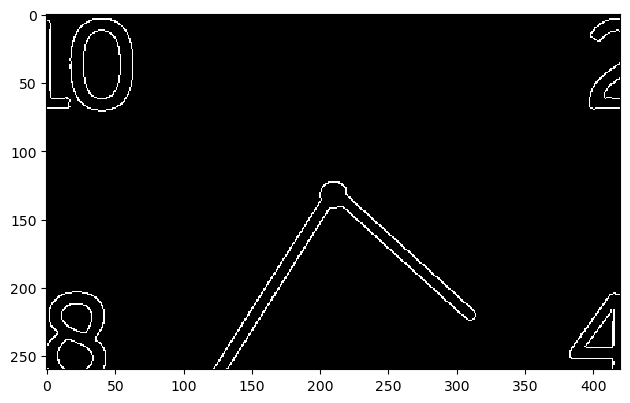

In [124]:
# Posmatranje samo središnjeg dela sata
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocks/clock4.png'))
clock = clock_png[:,:,0]
clock_center_canny = ski.feature.canny(clock,0.1,0.2,0.8) # manje agresivno izdvajanje ivica zbog detekcije centra
center_x, center_y = get_circle_center(clock_center_canny)[0][0],get_circle_center(clock_center_canny)[1][0]
clock_canny = ski.feature.canny(clock,0.15,1.2,2.8)   # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
[N,M]=clock_canny.shape
clock_canny_ticks = clock_canny[center_y-N//5:center_y+N//5,center_x-M//4:center_x+M//4]
center_x_cropped, center_y_cropped = center_x-3*N//10, center_y - M//4
print(center_x_cropped,center_y_cropped)
ski.io.imshow(clock_canny_ticks, cmap='grey');


Pronadjeno je 2 pikova
32.50 251.00
-47.67 50.00


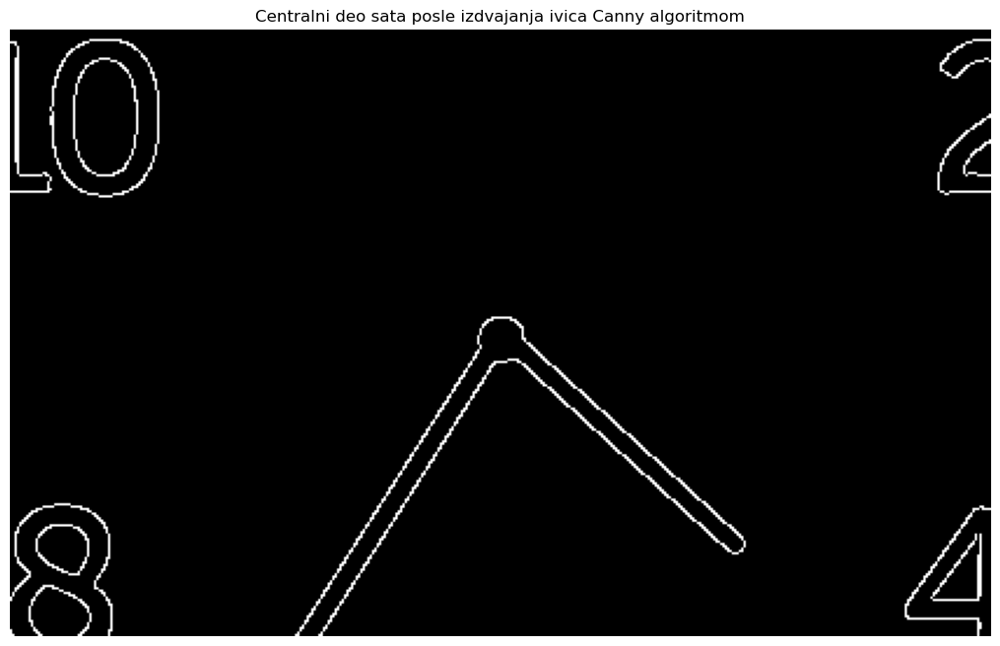

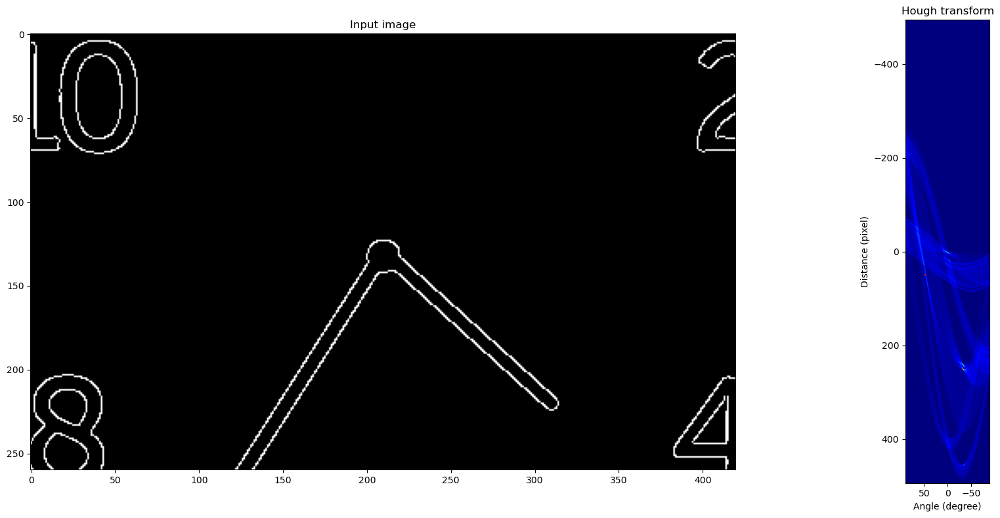

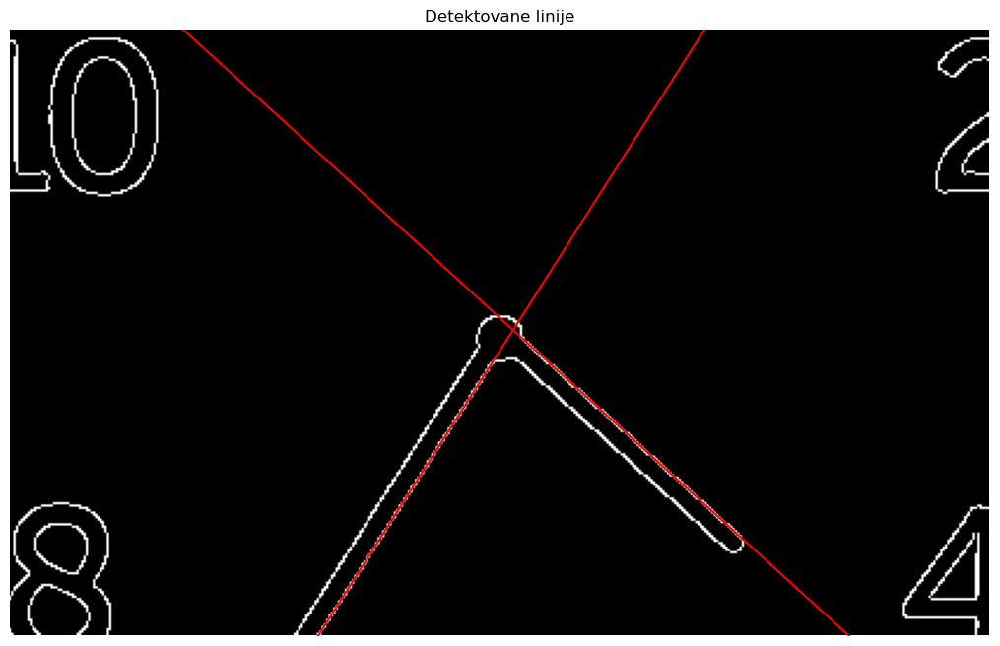

In [125]:
# Detekcija linija za centralni deo sata


 

img_edges = clock_canny_ticks


fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap='gray', vmin=0, vmax=1), axes.axis('off'), axes.set_title('Centralni deo sata posle izdvajanja ivica Canny algoritmom')

tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(img_edges, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=65, num_peaks=2)   # The intensity is the total number of votes for a particular line (angle-distance combination)
# num_peaks=11 maksimalni broj pikova
fix, axes = plt.subplots(1, 2, figsize=(20, 8))

print('Pronadjeno je '+str(np.shape(peak_angles)[0])+' pikova')
for angle, dist in zip(peak_angles, peak_distances):
    "%5.4x"% (47)
    print('%.2f %.2f'% (np.rad2deg(angle), dist))


axes[0].imshow(img_edges, cmap=plt.cm.gray)
axes[0].set_title('Input image')
axes[1].imshow(
    out, cmap=plt.cm.jet,
    extent=(np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]))     # extent xmax,xmin pa onda ymax,ymin
axes[1].set_title('Hough transform')
axes[1].set_xlabel('Angle (degree)')
axes[1].set_ylabel('Distance (pixel)')
axes[1].scatter(np.rad2deg(-peak_angles), peak_distances, s=2, c='r', marker='+')
plt.tight_layout()

# plot detected lines
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap=plt.cm.gray)
axes.set_title('Detektovane linije')
origin = np.array((0, img_edges.shape[1]))
for _, angle, dist in zip(intensity, peak_angles, peak_distances):
    y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
    axes.plot(origin, (y0, y1), '-r')
axes.set_xlim(origin)
axes.set_ylim((img_edges.shape[0], 0))
axes.set_axis_off()











    
    

Duzina najduzeg segmenta: 135
Koordinate: (133, 259, 205, 144)
Duzina najduzeg segmenta: 126
Koordinate: (313, 217, 219, 132)


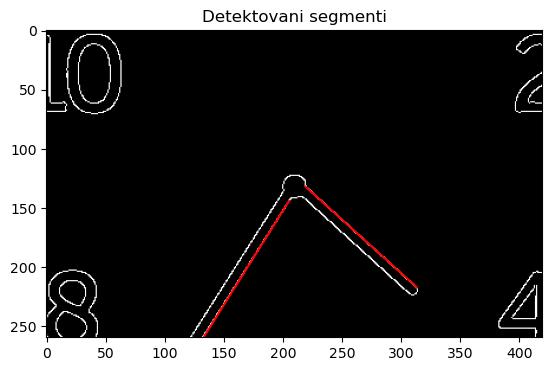

In [126]:
# Detekcija segmenata pomoću modifikovane funkcije get_line_segments_clock
img_edges = clock_canny_ticks 


# Parametri odredjeni prethodno u ćeliji iznad
theta, rho = np.deg2rad(32.50), 251        
theta1, rho1 = np.deg2rad(-47.67), 50

                                        
min_length = 65
max_gap = 7
tolerancy = 2


longest_segment_coord, longest_segment_size = get_line_segments_clock(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)

longest_segment_coord_1, longest_segment_size_1 = get_line_segments_clock(
    img_edges, (theta1, rho1), min_length, max_gap, tolerancy
)

if longest_segment_coord:
    print(f"Duzina najduzeg segmenta: {longest_segment_size}")
    print(f"Koordinate: {longest_segment_coord}")
    print(f"Duzina najduzeg segmenta: {longest_segment_size_1}")
    print(f"Koordinate: {longest_segment_coord_1}")
    fig, ax = plt.subplots()
    ax.imshow(img_edges, cmap=plt.cm.gray)
    x1, y1, x2, y2 = longest_segment_coord
    x11, y11, x21, y21 = longest_segment_coord_1
    ax.plot((x1, x2), (y1, y2), '-r')
    ax.plot((x11, x21), (y11, y21), '-r')
    ax.set_title('Detektovani segmenti')
    plt.show()
else:
    print("No valid segments detected.")

In [127]:
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(clock_canny_ticks, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=65, num_peaks=2)     


hands_angles = [] # uglovi kazaljki u odnosu na vertikalnu osu
hands_length = [] # dužine kazaljki

center_x_cropped, center_y_cropped = center_x-3*N//10, center_y - M//4
for i in range(0,np.shape(peak_angles)[0]):
        line=peak_angles[i], peak_distances[i]
        hands = get_line_segments_clock(clock_canny_ticks, line, 65, 7, 2)  # detekcija segmenata vecih od odredjene duine duz pravca zadatog sa line
        if get_distance((hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped)<get_distance((hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped):
            hands_angles.append(get_angle((hands[0])[0],(hands[0])[1],(hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])
        else:
            hands_angles.append(get_angle((hands[0])[2],(hands[0])[3],(hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])
                
    
    
    

    
    
if len(hands_angles)==1:
    hour_angle=minute_angle=hands_angles[0]
    print('Ugao satne i minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)

if hands_length[0]>hands_length[1]:
    hour_angle=hands_angles[1]
    minute_angle=hands_angles[0]
    print('Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)
    print('Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', minute_angle)
else:
    hour_angle=hands_length[0]
    minute_angle=hands_angles[1]
    print('Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)
    print('Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', minute_angle)
print('Detektovano vreme na satu clock 4.png: ', get_time(hour_angle,minute_angle))

Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru:  132.12163050026598
Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru:  212.05014552672117
Detektovano vreme na satu clock 4.png:  [4, 35]


59 76


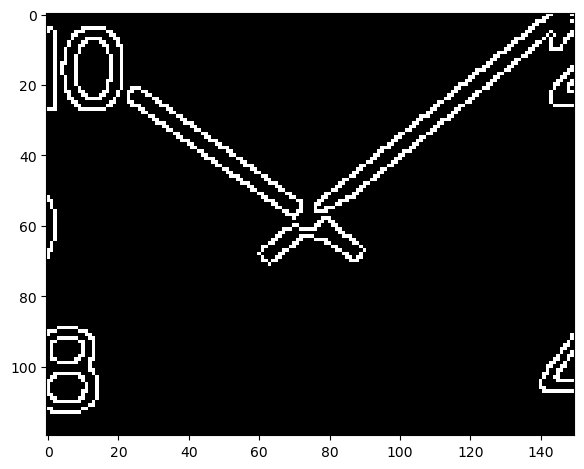

In [128]:
# Posmatranje samo središnjeg dela sata
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocks/clock11.png'))
clock = clock_png[:,:,0]
clock_center_canny = ski.feature.canny(clock,0.1,0.2,0.8) # manje agresivno izdvajanje ivica zbog detekcije centra
center_x, center_y = get_circle_center(clock_center_canny)[0][0],get_circle_center(clock_center_canny)[1][0]
clock_canny = ski.feature.canny(clock,0.15,1.2,2.8)   # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
[N,M]=clock_canny.shape
clock_canny_ticks = clock_canny[center_y-N//5:center_y+N//5,center_x-M//4:center_x+M//4]
center_x_cropped, center_y_cropped = center_x-3*N//10, center_y - M//4
print(center_x_cropped,center_y_cropped)
ski.io.imshow(clock_canny_ticks, cmap='grey');


Pronadjeno je 2 pikova
51.00 90.00
-54.67 -2.00


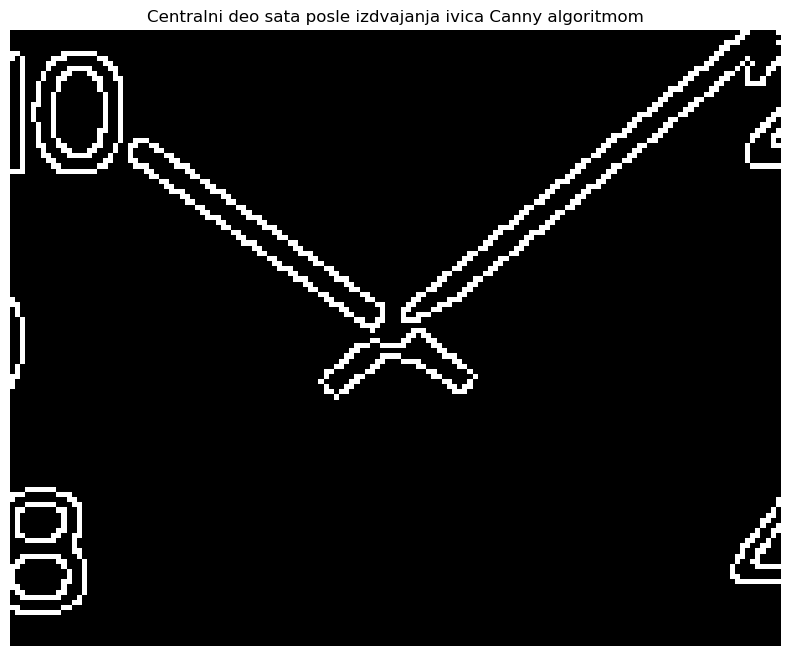

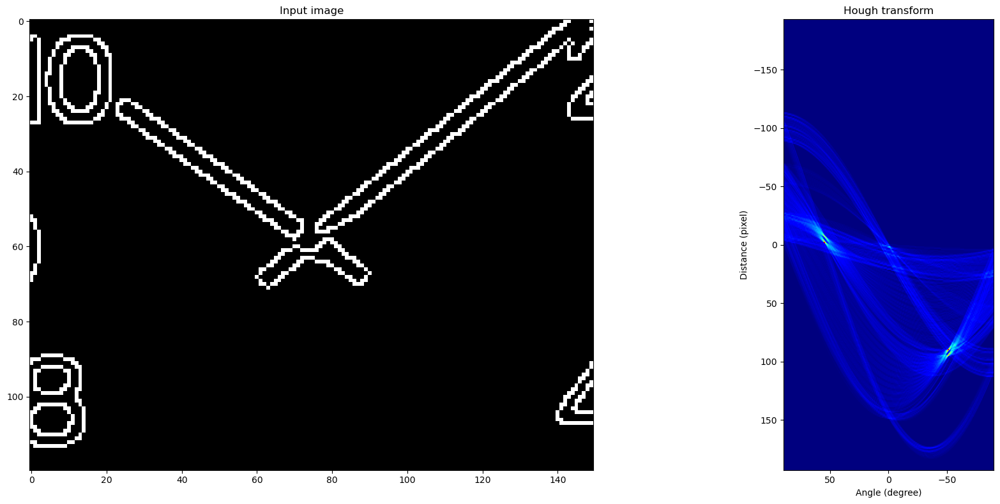

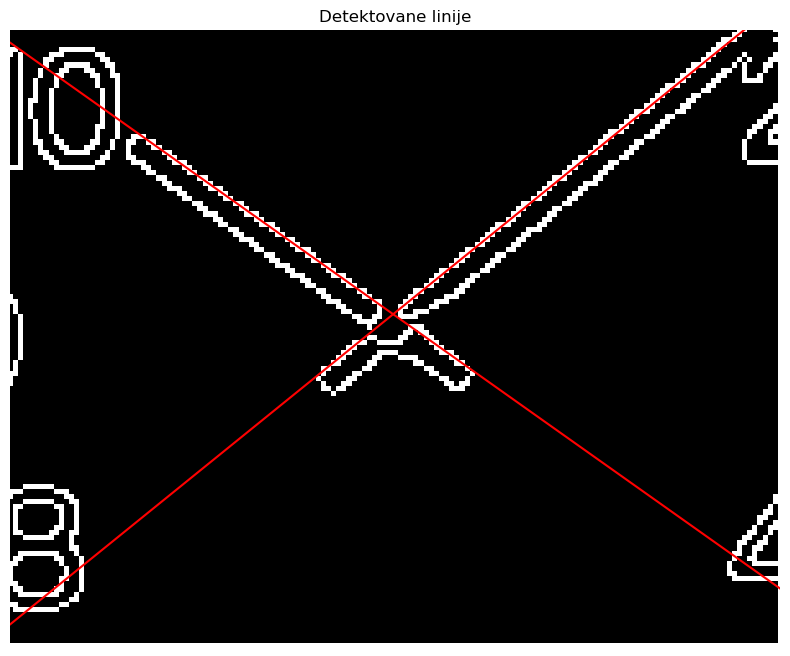

In [129]:
# Detekcija linija za centralni deo sata



 

img_edges = clock_canny_ticks


fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap='gray', vmin=0, vmax=1), axes.axis('off'), axes.set_title('Centralni deo sata posle izdvajanja ivica Canny algoritmom')

tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(img_edges, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=65, num_peaks=2)   # The intensity is the total number of votes for a particular line (angle-distance combination)
# num_peaks=11 maksimalni broj pikova
fix, axes = plt.subplots(1, 2, figsize=(20, 8))

print('Pronadjeno je '+str(np.shape(peak_angles)[0])+' pikova')
for angle, dist in zip(peak_angles, peak_distances):
    "%5.4x"% (47)
    print('%.2f %.2f'% (np.rad2deg(angle), dist))


axes[0].imshow(img_edges, cmap=plt.cm.gray)
axes[0].set_title('Input image')
axes[1].imshow(
    out, cmap=plt.cm.jet,
    extent=(np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]))     # extent xmax,xmin pa onda ymax,ymin
axes[1].set_title('Hough transform')
axes[1].set_xlabel('Angle (degree)')
axes[1].set_ylabel('Distance (pixel)')
axes[1].scatter(np.rad2deg(-peak_angles), peak_distances, s=2, c='r', marker='+')
plt.tight_layout()

# plot detected lines
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap=plt.cm.gray)
axes.set_title('Detektovane linije')
origin = np.array((0, img_edges.shape[1]))
for _, angle, dist in zip(intensity, peak_angles, peak_distances):
    y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
    axes.plot(origin, (y0, y1), '-r')
axes.set_xlim(origin)
axes.set_ylim((img_edges.shape[0], 0))
axes.set_axis_off()











    
    

Duzina najduzeg segmenta: 105
Koordinate: (61, 66, 143, 0)
Duzina najduzeg segmenta: 85
Koordinate: (88, 65, 18, 16)


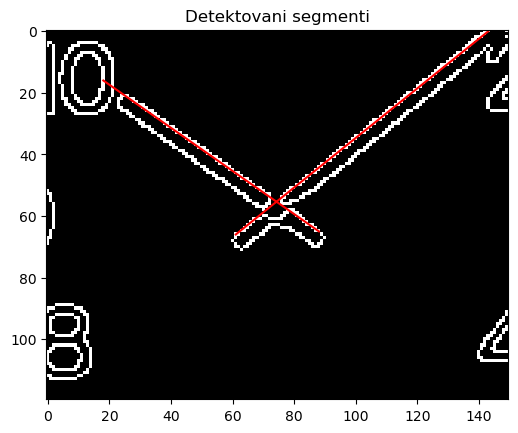

In [130]:
# Detekcija segmenata pomoću modifikovane funkcije get_line_segments_clock
img_edges = clock_canny_ticks 


# Parametri odredjeni prethodno u ćeliji iznad
theta, rho = np.deg2rad(51), 90
theta1, rho1 = np.deg2rad(-54.67), -2
                                        
min_length = 65
max_gap = 7
tolerancy = 2


longest_segment_coord, longest_segment_size = get_line_segments_clock(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)

longest_segment_coord_1, longest_segment_size_1 = get_line_segments_clock(
    img_edges, (theta1, rho1), min_length, max_gap, tolerancy
)

if longest_segment_coord:
    print(f"Duzina najduzeg segmenta: {longest_segment_size}")
    print(f"Koordinate: {longest_segment_coord}")
    print(f"Duzina najduzeg segmenta: {longest_segment_size_1}")
    print(f"Koordinate: {longest_segment_coord_1}")
    fig, ax = plt.subplots()
    ax.imshow(img_edges, cmap=plt.cm.gray)
    x1, y1, x2, y2 = longest_segment_coord
    x11, y11, x21, y21 = longest_segment_coord_1
    ax.plot((x1, x2), (y1, y2), '-r')
    ax.plot((x11, x21), (y11, y21), '-r')
    ax.set_title('Detektovani segmenti')
    plt.show()
else:
    print("No valid segments detected.")

In [131]:
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(clock_canny_ticks, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=65, num_peaks=2)     


hands_angles = [] # uglovi kazaljki u odnosu na vertikalnu osu
hands_length = [] # dužine kazaljki

center_x_cropped, center_y_cropped = center_x-3*N//10, center_y - M//4
for i in range(0,np.shape(peak_angles)[0]):
        line=peak_angles[i], peak_distances[i]
        hands = get_line_segments_clock(clock_canny_ticks, line, 65, 7, 2)  # detekcija segmenata vecih od odredjene duine duz pravca zadatog sa line
        if get_distance((hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped)<get_distance((hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped):
            hands_angles.append(get_angle((hands[0])[0],(hands[0])[1],(hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])
        else:
            hands_angles.append(get_angle((hands[0])[2],(hands[0])[3],(hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])
                
    
    
    

    
    
if len(hands_angles)==1:
    hour_angle=minute_angle=hands_angles[0]
    print('Ugao satne i minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)

if hands_length[0]>hands_length[1]:
    hour_angle=hands_angles[1]
    minute_angle=hands_angles[0]
    print('Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)
    print('Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', minute_angle)
else:
    hour_angle=hands_length[0]
    minute_angle=hands_angles[1]
    print('Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', hour_angle)
    print('Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru: ', minute_angle)
print('Detektovano vreme na satu clock 11.png: ', get_time(hour_angle,minute_angle))

Ugao satne kazaljke u odnosu na vertikalnu osu u CCW smeru:  304.99202019855863
Ugao minutne kazaljke u odnosu na vertikalnu osu u CCW smeru:  51.170175095029606
Detektovano vreme na satu clock 11.png:  [10, 8]


In [150]:

# GLAVNA-extract_time funkcija

def extract_time(img_in):

    
    # Pravimo od clock_canny sliku gde su izdvojene samo kazaljke radi lakse detekcije
    clock = img_in[:,:,0]
    clock_center_canny = ski.feature.canny(clock,0.1,0.2,0.8) # manje agresivno izdvajanje ivica zbog detekcije centra
    center_x, center_y = get_circle_center(clock_center_canny)[0][0],get_circle_center(clock_center_canny)[1][0]
    clock_canny = ski.feature.canny(clock,0.15,1.2,2.8)   # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
    [N,M]=clock_canny.shape
    clock_canny_ticks = clock_canny[center_y-N//5:center_y+N//5,center_x-M//4:center_x+M//4]
    
    tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
    [out, angles, distances] = ski.transform.hough_line(clock_canny_ticks, theta = tested_angles)
    [intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=65, num_peaks=2)     
    
    
    hands_angles = [] # uglovi kazaljki u odnosu na vertikalnu osu
    hands_length = []
    
    center_x_cropped, center_y_cropped = center_x-3*N//10, center_y - M//4
    
    
    for i in range(0,np.shape(peak_angles)[0]):  # prolazimo kroz detektovane linije
        line=peak_angles[i], peak_distances[i]
        hands = get_line_segments_clock(clock_canny_ticks, line, 65, 7, 2)  # detekcija segmenata vecih od odredjene duine duz pravca zadatog sa line
        if get_distance((hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped)<get_distance((hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped):  
            hands_angles.append(get_angle((hands[0])[0],(hands[0])[1],(hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])

        # Provera da li je prvi par koordinata bliži centru radi pravilnog detektovanja ugla pomoću get_angle
        # Vektor kazaljke mora biti definisan od centra ka obodu sata
        else:
            hands_angles.append(get_angle((hands[0])[2],(hands[0])[3],(hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped))
            hands_length.append(hands[1])
                
    
    # Ako se kazaljke poklapaju
    if len(hands_angles)==1:
        hour_angle=minute_angle=hands_angles[0]
        return get_time(hour_angle,minute_angle) 
    # Odredjivanje minutne i satne kazaljke na osnovu dužine
    if hands_length[0]>hands_length[1]:
        hour_angle=hands_angles[1]
        minute_angle=hands_angles[0]
        return get_time(hour_angle,minute_angle)
    else:
        hour_angle=hands_angles[0]
        minute_angle=hands_angles[1]
        return get_time(hour_angle,minute_angle)
    
    
    
                

In [151]:
import os
from skimage import io, util

# Definisanje direktorijuma u kome se nalaze test sekvence
clock_dir = 'image_sequences/clocks'


image_files = sorted([f for f in os.listdir(clock_dir) if f.endswith(('.png', '.jpg'))])


for image_file in image_files:
    image_path = os.path.join(clock_dir, image_file)
    clock_image = util.img_as_float(io.imread(image_path))
    time = extract_time(clock_image)
    print(f"{image_file}: {time}")


clock1.png: [0, 15]
clock10.png: [0, 48]
clock11.png: [10, 8]
clock12.jpg: [8, 16]
clock2.png: [9, 11]
clock3.png: [1, 24]
clock4.png: [4, 35]
clock5.png: [11, 30]
clock6.png: [0, 0]
clock7.jpg: [10, 7]
clock8.jpg: [8, 22]
clock9.jpg: [3, 23]


| Sekvenca   | Detektovano vreme |
|------------|-------------------|
| clock1.png | [0, 15]           |
| clock2.png | [9, 11]           |
| clock3.png | [1, 24]           |
| clock4.png | [4, 35]           |
| clock5.png | [11, 29]          |
| clock6.png | [0, 0]            |
| clock7.jpg | [10, 7]           |
| clock8.jpg | [8, 21]           |
| clock9.jpg | [3, 23]           |
| clock10.png| [0, 48]           |
| clock11.png| [10, 8]           |
| clock12.jpg| [8, 16]           |


### BONUS Proširivanje funkcije `extract_time`

1800 4000
400 360
[((0, 641, 341, 384), 427), ((320, 580, 368, 430), 157)]


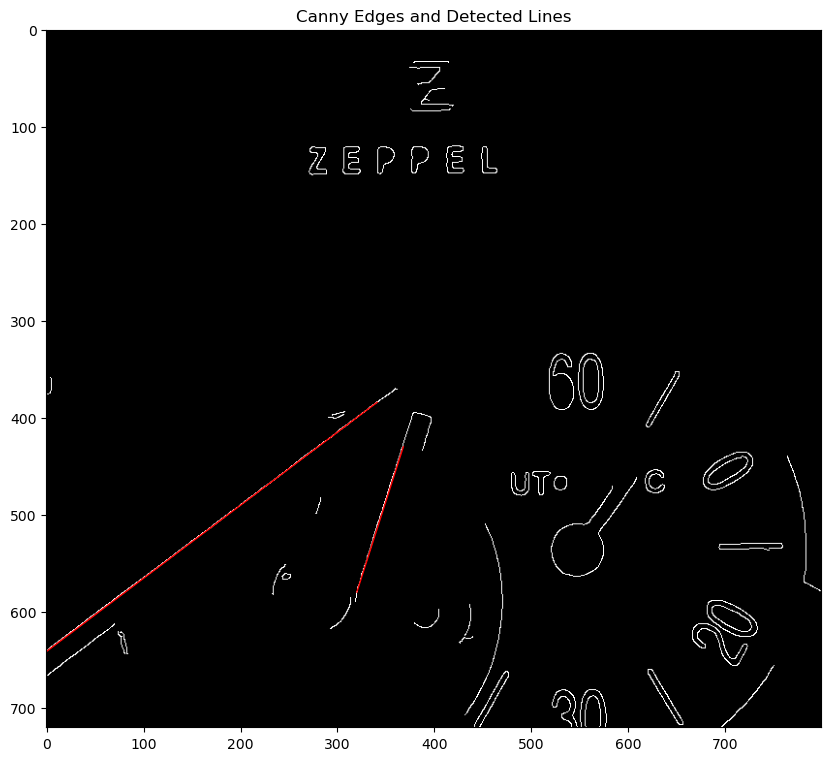

In [174]:
h_m_s_lines=[]
center_x=917
center_y=1456
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus1.jpg'))
clock = clock_png[:,:,0]
clock_canny = ski.feature.canny(clock,1,0.5,1.1) # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
[N,M]=clock_canny.shape
print(N,M)
clock_canny_ticks = clock_canny[center_x-N//5:center_x+N//5,center_y-M//10:center_y+M//10]
center_y_cropped, center_x_cropped = N//5, M//10
print(center_x_cropped,center_y_cropped)
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 1080, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(clock_canny_ticks, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=55, num_peaks=4)   # The intensity is the total number of votes for a particular line (angle-distance combination)
for i in range(0,2):
    line=peak_angles[i], peak_distances[i]
    hand = get_line_segments_clock(clock_canny_ticks,line,65,10,2)
    h_m_s_lines.append(hand)

print(h_m_s_lines)

# Dobijamo listu linija koje cine kazaljke za sate, minute i sekunde



# Plotting
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Display the edges from the Canny detector
ax.imshow(clock_canny_ticks, cmap='gray')

# Overlay the detected lines in red
for line_segments in h_m_s_lines:
        (x1, y1, x2, y2), _ = line_segments  # Unpack the line coordinates, ignore the second value
        ax.plot((x1, x2), (y1, y2), color='red', linewidth=1)


plt.title("Canny Edges and Detected Lines")
plt.show()


In [93]:
center_x = 1481
center_y = 1577
radius = 800
grupe = group_lines_detection_new(h_m_s_lines, center_x,center_y,radius);

[{'lines': [((1429, 1548, 1314, 1119), 444), ((1396, 1283, 1328, 1108), 187)], 'mean_angle': -105.00620495518729, 'mean_max_length': 490.41105852137025}, {'lines': [((1113, 1435, 828, 1315), 309)], 'mean_angle': -157.16634582208246, 'mean_max_length': 703.600028425241}, {'lines': [((1728, 1661, 1528, 1584), 214), ((1728, 1661, 1528, 1584), 214)], 'mean_angle': -158.94329440929525, 'mean_max_length': 260.8926982496827}]


In [84]:
import numpy as np
import math

def group_lines_detection_new(lines, center_x, center_y, radius):
    groups = []
    
    for line in lines:
        x1, y1, x2, y2 = line[0]

        # Calculate the distances from the line endpoints to the center of the clock
        length1 = np.sqrt((x1 - center_x)**2 + (y1 - center_y)**2)
        length2 = np.sqrt((x2 - center_x)**2 + (y2 - center_y)**2)

        # Determine the maximum distance
        max_length = max(length1, length2)

        # Check if the line's endpoints are within the specified radius constraints
        if max_length < radius and min(length1, length2) < 0.5 * radius:
            # Calculate the angle of the line in degrees
            angle = math.degrees(math.atan2(y2 - y1, x2 - x1))
            
            # Flag to track if the line has been added to a group
            grouped = False
            
            for group in groups:
                mean_angle = group['mean_angle']
                
                # Check if the angle difference is within 12 degrees or if it's a parallel line
                if abs(angle - mean_angle) < 12 or abs(angle - mean_angle - 180) < 12 or abs(angle - mean_angle + 180) < 12:
                    # Define a tolerance for similar max_length (e.g., 10% of the radius)
                    length_tolerance = 0.1 * radius
                    
                    # Check if the line belongs to the same max_length group
                    if abs(group['mean_max_length'] - max_length) <= length_tolerance:
                        group['lines'].append((line, max_length))
                        # Update mean_max_length for the group
                        group['mean_max_length'] = np.mean([l[1] for l in group['lines']])
                        grouped = True
                        break
            
            # If the line wasn't grouped, create a new group
            if not grouped:
                groups.append({
                    'lines': [(line, max_length)],
                    'mean_angle': angle,
                    'mean_max_length': max_length
                })
    
    # Simplify output by removing the max_length from the tuples for clarity
    for group in groups:
        group['lines'] = [line[0] for line in group['lines']]
    
    print(groups)
    return groups


In [81]:

# Funkcija group_lines_detection grupise linije koje su skoro paralelne

def group_lines_detection(lines, center_x, center_y, radius):
    groups =[]
    for line in lines:
        x1, y1, x2, y2 = line[0]

        # Calculate the length from the two ends of the line to the center of the clock
        length1 = np.sqrt((x1 - center_x)**2 + (y1 - center_y)**2)
        length2 = np.sqrt((x2 - center_x)**2 + (y2 - center_y)**2)

        # max_length furthest point from the center of the clock
        # min_length closest point to the center of the clock
        max_length = np.max([length1, length2])
        min_length = np.min ([length1, length2])

        # The farthest point must be within the radius of the clock and the nearest point must only be within 50% of the radius of the clock
        if ((max_length < radius) and (min_length < radius*50/100)):

            # Calculate the angle of the line in degrees
            angle = math.atan2(y2 - y1, x2 - x1)
            angle = math.degrees(angle)
            
            # Initialize flag variable to check whether the line belongs to any group or not
            grouped = False
            
            for group in groups:
                
                # Get the average angle of the group
                mean_angle = group['mean_angle']
                
                # If the angle of the line and the average angle of the group differ by less than 12 degrees or are equal when plus or minus 180 degrees
                # (this means the line is parallel or in the same direction as the group)
                if abs(angle - mean_angle) < 12 or abs(angle - mean_angle - 180) < 12 or abs(angle - mean_angle + 180) < 12:
                    
                    # Add lines to the group
                    group['lines'].append(line)

                    # Set the flag variable to True to signal that the group has been found
                    grouped = True
                    break
            
            # If you cannot find a suitable group
            if not grouped:
                # Create a new group with its lines and angles
                groups.append({'lines': [line], 'mean_angle': angle})
    print(groups)
    return groups

In [11]:
# Funkcija koja racuna rastojanje izmedju 2 paralelne linije
def distance_between_parallel_lines(line1, line2):
    # Get the coordinates of two points on each line
    x1_1, y1_1, x2_1, y2_1 = line1[0]
    x1_2, y1_2, x2_2, y2_2 = line2[0]

    # Create two direction vectors of two straight lines
    vector1 = np.array([x2_1 - x1_1, y2_1 - y1_1])
    vector2 = np.array([x2_2 - x1_2, y2_2 - y1_2])

    #Creates a vector connecting a point on one line to a point on the other line
    vector_between_lines = np.array([x1_2 - x1_1, y1_2 - y1_1])

    #Calculates the perpendicular distance between the two lines.
    distance = np.abs(np.cross(vector1, vector_between_lines)) / np.linalg.norm(vector1)

    return distance


In [12]:
# The hands detection function has the function of finding the farthest endpoint from the clock center of a line segment among line segments
# in the same group to create a clock hand with the clock center point.
def hands_detection(groups, center_x, center_y):
    # Initialize a list to store clock hands
    hands = []

    # Browse through groups of lines
    for group in groups:
        # Get the list of lines in the group and number of lines
        lines = group['lines']
        num_lines = len(lines)

        # Initialize variables to store the maximum thickness and length of the lines
        max_thickness = 0
        max_length = 0
        
        # Browse lines in groups
        for i in range(num_lines):
            x1, y1, x2, y2 = lines[i][0]
            
            # Calculate the distance from two points to the center of the clock
            length1 = np.sqrt((x1 - center_x)**2 + (y1 - center_y)**2)
            length2 = np.sqrt((x2 - center_x)**2 + (y2 - center_y)**2)

            # Take the larger distance as the length of the line
            length = np.max([length1, length2])

            # If the length is greater than the current maximum length
            if length > max_length:
                max_length = length

                # Take the point farthest from the center as the end point of the clock hand
                if length == length1:
                    max_line = x1, y1, center_x, center_y
                else:
                    max_line = x2, y2, center_x, center_y

            # Browse through the remaining lines in the group
            for j in range(i+1, num_lines):
                # Calculate the distance between two lines using a distance_between_parallel_lines function
                thickness = distance_between_parallel_lines(lines[i], lines[j])

                # Update maximum thickness
                if (thickness > max_thickness):
                    max_thickness = thickness

        # Create a set of line, thickness and length
        line = max_line, max_thickness, max_length

        # If the thickness is greater than 0, it means there are at least two parallel lines
        if max_thickness > 0:
            # Add this set to the clock hands list
            hands.append(line)

    # Sort the list of clock hands by length in descending order
    hands.sort(key=lambda x: x[2], reverse=True)

    # Take the first three clock hands as the clock hands
    hands = hands[:3]
    return hands



In [13]:
# The get_hands function has the function of accurately determining the hour, minute, and second hands
# from the 3 clock hands found in the hands_detection function.
def get_hands(hands):
    # Arrange the clock hands by thickness
    sorted_hands_by_thickness = sorted(hands, key=lambda hands: hands[1])
    
    # The second hand is the hand with the smallest thickness
    second_hand = sorted_hands_by_thickness[0]

    # Remove the second hand from the list containing 3 clock hands
    hands.remove(second_hand)

    # Arrange the remaining 2 clock hands by length
    sorted_hands_by_length = sorted(hands, key=lambda hands: hands[2])

    # The hour hand is the hand with the shortest length and the remaining hand is the minute hand
    hour_hand = sorted_hands_by_length[0]
    minute_hand = sorted_hands_by_length[1]
    print (hour_hand, minute_hand, second_hand)
    return hour_hand, minute_hand, second_hand

In [94]:
# Detekcija kazaljki
hands=hands_detection(grupe,center_x,center_y)
h_m_s=get_hands(hands)
print(h_m_s[1][0][0])

IndexError: list index out of range

In [87]:
get_angle(h_m_s[0][0][2],h_m_s[0][0][3],h_m_s[0][0][0],h_m_s[0][0][1],center_x,center_y)  # satna

50.23278804918941

In [88]:
get_angle(h_m_s[1][0][2],h_m_s[1][0][3],h_m_s[1][0][0],h_m_s[1][0][1],center_x,center_y)  # minutna

229.55813403717906

In [89]:
get_angle(h_m_s[2][0][2],h_m_s[2][0][3],h_m_s[2][0][0],h_m_s[2][0][1],center_x,center_y)  # sekundara

163.76179933439224

In [24]:
# Odredjivanje centra sata iz direktorijuma bonus i cropovanje oko centralnog dela sata

'''
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus8.jpg'))
clock = clock_png[:,:,0]
clock_center_canny = ski.feature.canny(clock,0.5,0.1,0.25) # manje agresivno izdvajanje ivica zbog detekcije centra
center_y, center_x = get_circle_center_bonus(clock_center_canny)[0][0],get_circle_center_bonus(clock_center_canny)[1][0]
clock_canny = ski.feature.canny(clock,1,0.6,1) # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
clock_canny_second_canny = ski.feature.canny(clock,1,0.2,1)
clock_canny_second_hand = np.subtract(clock_canny.astype(int), clock_canny_second_canny.astype(int))
[N,M]=clock_canny.shape
print(N,M)
clock_canny_ticks = clock_canny[center_x-N//4:center_x+N//4,center_y-M//3:center_y+M//3]
center_y_cropped, center_x_cropped = N//4, M//3
print(center_x_cropped,center_y_cropped)
ski.io.imshow(clock_canny_ticks, cmap='grey');

'''

NameError: name 'get_circle_center_bonus' is not defined

Pronadjeno je 6 pikova
53.10 1592.00
53.19 1612.00
59.49 1535.00
29.43 1719.00
17.19 1651.00
17.37 1674.00


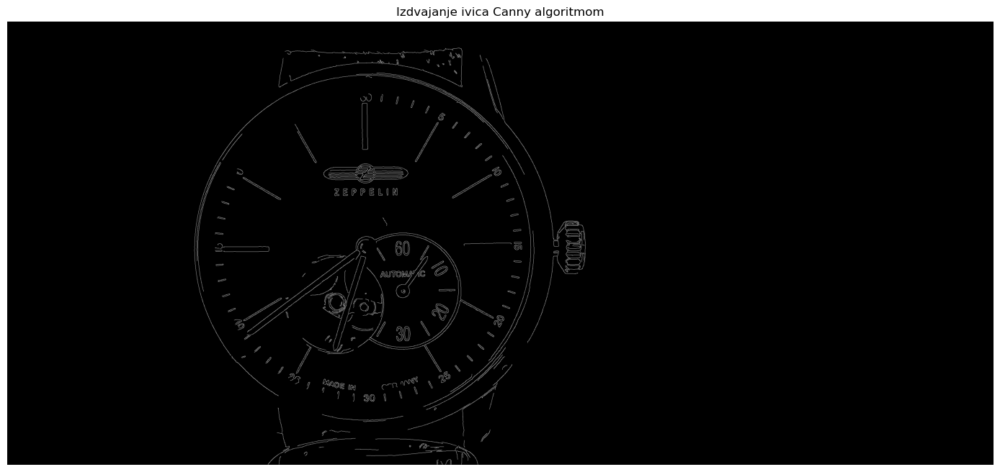

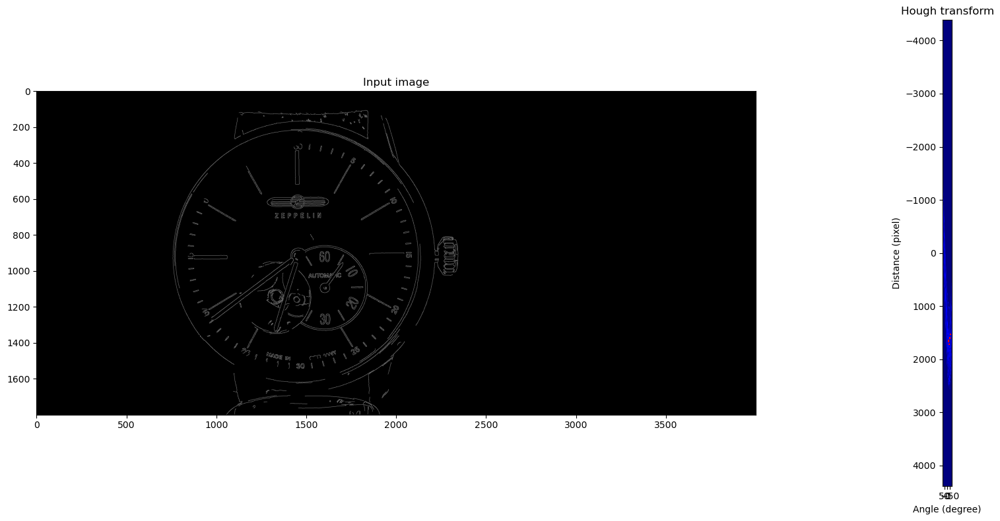

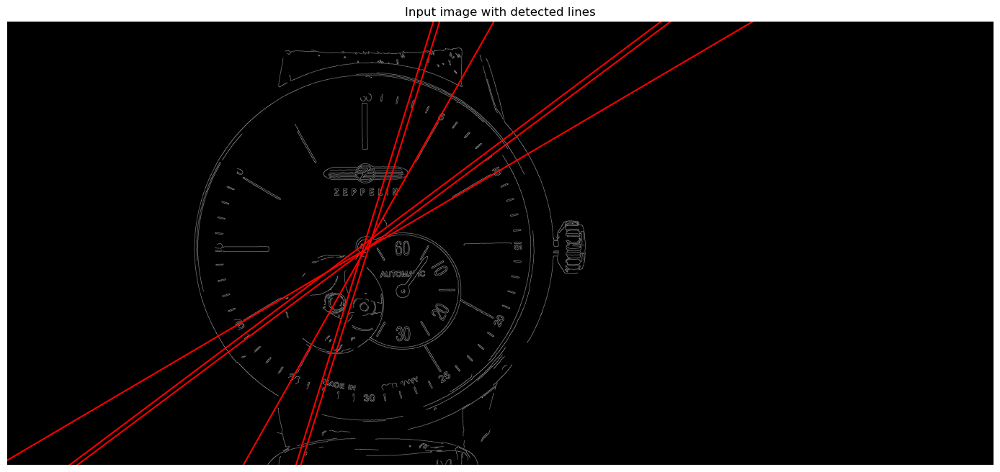

In [149]:



 
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus1.jpg'))
clock = clock_png[:,:,0]
clock_canny = ski.feature.canny(clock,1,0.25,0.5) # agresivnije izdvajanje ivica zbog detekcije satne i minutne kazaljke
clock_canny_second_canny = ski.feature.canny(clock,1,0.2,1)
clock_canny_second_hand = np.subtract(clock_canny.astype(int), clock_canny_second_canny.astype(int))

# Erosion or dilation
dilation=ski.morphology.binary_dilation(clock_canny)
img_edges = clock_canny


fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap='gray', vmin=0, vmax=1), axes.axis('off'), axes.set_title('Izdvajanje ivica Canny algoritmom')

tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 2000, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(img_edges, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=55, num_peaks=6)   # The intensity is the total number of votes for a particular line (angle-distance combination)
# num_peaks=11 maksimalni broj pikova
fix, axes = plt.subplots(1, 2, figsize=(20, 8))

print('Pronadjeno je '+str(np.shape(peak_angles)[0])+' pikova')
for angle, dist in zip(peak_angles, peak_distances):
    "%5.4x"% (47)
    print('%.2f %.2f'% (np.rad2deg(angle), dist))


axes[0].imshow(img_edges, cmap=plt.cm.gray)
axes[0].set_title('Input image')
axes[1].imshow(
    out, cmap=plt.cm.jet,
    extent=(np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]))     # extent xmax,xmin pa onda ymax,ymin
axes[1].set_title('Hough transform')
axes[1].set_xlabel('Angle (degree)')
axes[1].set_ylabel('Distance (pixel)')
axes[1].scatter(np.rad2deg(-peak_angles), peak_distances, s=2, c='r', marker='+')
plt.tight_layout()

# plot detected lines
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap=plt.cm.gray)
axes.set_title('Input image with detected lines')
origin = np.array((0, img_edges.shape[1]))
for _, angle, dist in zip(intensity, peak_angles, peak_distances):
    y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
    axes.plot(origin, (y0, y1), '-r')
axes.set_xlim(origin)
axes.set_ylim((img_edges.shape[0], 0))
axes.set_axis_off()


# NAPOMENA: Hough transformacija u Python-u nema opciju odredjivanja duzi na osnovu detektovanih pravih i izdvojenih ivica










In [127]:
def get_time_bonus(hour_angle, minute_angle, second_angle):
    # Calculate the time from the angle of the hour hand by dividing by 30 (each hour corresponds to 30 degrees)
    hour = hour_angle / 30

    # Calculate minutes and seconds from the angle of the minute and second hands by dividing by 6 (each minute or second corresponds to 6 degrees)
    minute = minute_angle / 6
    second = second_angle / 6

    #Adjust to avoid errors

    # If the angle of the hour hand is close to an integer multiplied with 30 (i.e. close to a specific hour)
    # and the angle of the minute hand is close to 0 or 360 (i.e. close to 12 o'clock)
    if (round(hour)*30 - hour_angle <= 6) and ((355 < minute_angle and minute_angle < 360) or (minute_angle < 90)):
        # Round hour up or down
        hour = round(hour)
        if hour == 12:
            hour = 0
    
    # If the angle of the hour hand is close to a specific hour
    # and the angle of the minute hand is close to 360 (ie close to 12 o'clock)
    # Then set minute to 0
    if (hour_angle - hour*30 <= 6) and (355 < minute_angle and minute_angle < 360):
        minute = 0

    # If the angle of the minute hand is close to an integer multiplied with 6 (i.e. close to a specific minute)
    # and the angle of the second hand is approximately between 0 and 6 (i.e. 1 round of 60 seconds has passed).
    if (round(minute)*6 - minute_angle <= 6) and (second_angle < 6):
        # Round minutes up or down
        minute = round(minute)
        if minute == 60:
            minute = 0

    # If the angle of the minute hand is close to a specific minute
    # and the angle of the second hand is close to 360 (ie close to 12 o'clock)
    # Then set second to 0
    if (minute_angle - minute*30 <= 6) and (354 < second_angle and second_angle < 360):
        second = 0

    hour = int(hour)
    minute = int(minute)
    second = int(second)

    # Create a time series in hh:mm:ss format
    time = f"{hour:02d}:{minute:02d}:{second:02d}"\

    return time

In [1]:

def get_time_clock_bonus(img_in):
# Pravimo od clock_canny sliku gde su izdvojene samo kazaljke radi lakse detekcije
    clock = img_in[:,:,0]
    clock_center_canny = ski.feature.canny(clock,0.1,0.25,0.5) # manje agresivno izdvajanje ivica zbog detekcije centra
    center_x, center_y, radius = get_circle_center_bonus(clock_center_canny)[0][0],get_circle_center_bonus(clock_center_canny)[1][0],get_circle_center_bonus(clock_center_canny)[2]
    clock_canny = ski.feature.canny(clock,1,0.2,0.5) 
    
    
    
    
    
    
    
    
    tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 2000, endpoint=False)
    [out, angles, distances] = ski.transform.hough_line(clock_canny, theta = tested_angles)
    [intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=55, num_peaks=6)     
    h_m_s_lines = []
    for i in range(0,6):
        line=peak_angles[i], peak_distances[i]
        hand = get_line_segments_clock(clock_canny,line,65,10,1)
        h_m_s_lines.append(hand)

    
    grupe=group_lines_detection(h_m_s_lines, center_x,center_y,radius)

    hands=hands_detection(grupe,center_x,center_y)
    h_m_s=get_hands(hands)

    h_angle = get_angle(h_m_s[0][0][2],h_m_s[0][0][3],h_m_s[0][0][0],h_m_s[0][0][1],center_x,center_y)
    m_angle = get_angle(h_m_s[1][0][2],h_m_s[1][0][3],h_m_s[1][0][0],h_m_s[1][0][1],center_x,center_y)
    s_angle = get_angle(h_m_s[2][0][2],h_m_s[2][0][3],h_m_s[2][0][0],h_m_s[2][0][1],center_x,center_y)
    
    print(get_time_bonus(h_angle,m_angle,s_angle))
    
    






In [46]:
clock_png_test = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus10.jpg'))
get_time_clock_bonus(clock_png_test)

[{'lines': [((1722, 2032, 2275, 1534), 744), ((2631, 1305, 2749, 1191), 164), ((1728, 2048, 2090, 1765), 459), ((2354, 1461, 2744, 1167), 488)], 'mean_angle': -42.00438062739826}, {'lines': [((2552, 2236, 2482, 1994), 251), ((2581, 2305, 2442, 1818), 506)], 'mean_angle': -106.13284053048538}]


IndexError: list index out of range

In [32]:
# Ideja za extractovanje prvo h i m, pa onda s i detekciju uglova


    #[outt, angless, distancess] = ski.transform.hough_line(clock_canny, theta = tested_angles)
    #[intensityy, peak_angless, peak_distancess] = ski.transform.hough_line_peaks(outt, angless, distancess, threshold=65, num_peaks=5)
    '''
    line_angle=[]
    line_rho=[]
    for i in range(0,5):
        if peak_angles[0] - 0.03 <=  peak_angless[i]  <= peak_angles[0] + 0.03:
            line_angle.append(peak_angless[i])
            line_rho.append(peak_distancess[i])
        if peak_angles[1] - 0.03 <=  peak_angless[i]  <= peak_angles[1] + 0.03:
            line_angle.append(peak_angless[i])
            line_rho.append(peak_distancess[i])
          
    
    
   
     
    # Petlja za satnu i minutnu kazaljku
    
    for i in range(0,np.shape(peak_angles)[0]):
        line=peak_angles[i], peak_distances[i]
        ticks = get_line_segments_clock(clock_canny_ticks, line, 65, 7, 2)  # detekcija segmenata vecih od odredjene duzine duz pravca zadatog sa line
        print(ticks)
        if get_distance((ticks[0])[0],(ticks[0])[1],center_x_cropped,center_y_cropped)<get_distance((ticks[0])[2],(ticks[0])[3],center_x_cropped,center_y_cropped):
            tick_angles.append(get_angle((ticks[0])[0],(ticks[0])[1],(ticks[0])[2],(ticks[0])[3],center_x_cropped,center_y_cropped))
            tick_size.append(ticks[1])
        else:
            tick_angles.append(get_angle((ticks[0])[2],(ticks[0])[3],(ticks[0])[0],(ticks[0])[1],center_x_cropped,center_y_cropped))
            tick_size.append(ticks[1])
                
    # Detekcija sekundare
    seconds_line=peak_angles_second[i], peak_distances_second[i]
    secnod_hand = get_line_segments_clock(clock_canny_second_hand, line, 65, 7, 2)  
    if get_distance(second_hand([0])[0],(second_ha[0])[1],center_x_cropped,center_y_cropped)<get_distance((second_hand[0])[2],(ticks[0])[3],center_x_cropped,center_y_cropped):
            tick_angles.append(get_angle((second_hand[0])[0],(second_hand[0])[1],(second_hand[0])[2],(second_hand[0])[3],center_x_cropped,center_y_cropped))
            tick_size.append(second_hand[1])
    else:
        tick_angles.append(get_angle((second_hand[0])[2],(second_hand[0])[3],(second_hand[0])[0],(second_hand[0])[1],center_x_cropped,center_y_cropped))
        tick_size.append(ticks[1])
    '''              






'\nline_angle=[]\nline_rho=[]\nfor i in range(0,5):\n    if peak_angles[0] - 0.03 <=  peak_angless[i]  <= peak_angles[0] + 0.03:\n        line_angle.append(peak_angless[i])\n        line_rho.append(peak_distancess[i])\n    if peak_angles[1] - 0.03 <=  peak_angless[i]  <= peak_angles[1] + 0.03:\n        line_angle.append(peak_angless[i])\n        line_rho.append(peak_distancess[i])\n      \n\n\n   \n \n# Petlja za satnu i minutnu kazaljku\n\nfor i in range(0,np.shape(peak_angles)[0]):\n    line=peak_angles[i], peak_distances[i]\n    ticks = get_line_segments_clock(clock_canny_ticks, line, 65, 7, 2)  # detekcija segmenata vecih od odredjene duzine duz pravca zadatog sa line\n    print(ticks)\n    if get_distance((ticks[0])[0],(ticks[0])[1],center_x_cropped,center_y_cropped)<get_distance((ticks[0])[2],(ticks[0])[3],center_x_cropped,center_y_cropped):\n        tick_angles.append(get_angle((ticks[0])[0],(ticks[0])[1],(ticks[0])[2],(ticks[0])[3],center_x_cropped,center_y_cropped))\n        t

### Erozija

In [12]:
def plot_comparison(original, filtered, filter_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 4), sharex=True, sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.set_axis_off()
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name)
    ax2.set_axis_off()

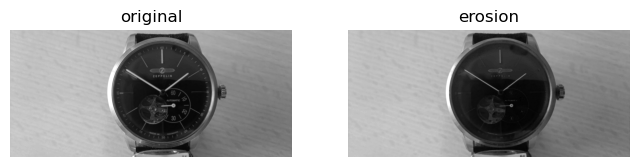

In [74]:
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, convex_hull_image
from skimage.morphology import disk
orig_jpg = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus7.jpg'))
orig=orig_jpg[:,:,0]
footprint = disk(7)
eroded = erosion(orig, footprint)

plot_comparison(orig , eroded, 'erosion')


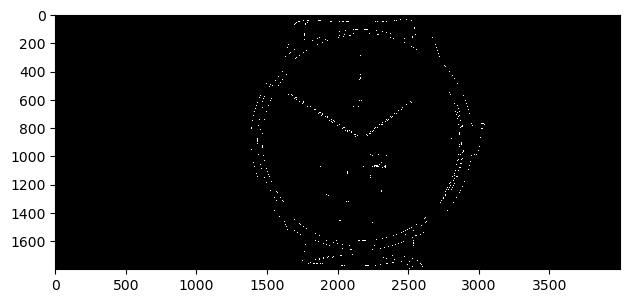

In [75]:
ski.io.imshow(ski.feature.canny(eroded,0.3,0.2,0.35))
hms=ski.feature.canny(eroded,0.3,0.2,0.35)

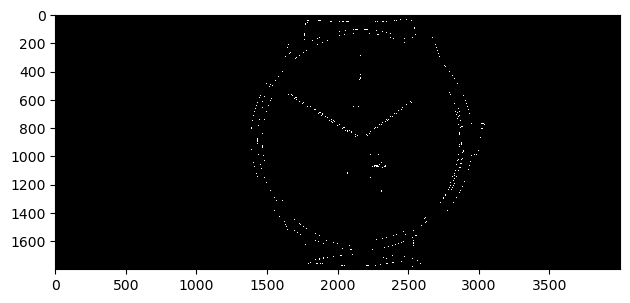

In [76]:
ski.io.imshow(ski.feature.canny(eroded,0.3,0.25,0.4))
hm=ski.feature.canny(eroded,0.3,0.25,0.4)

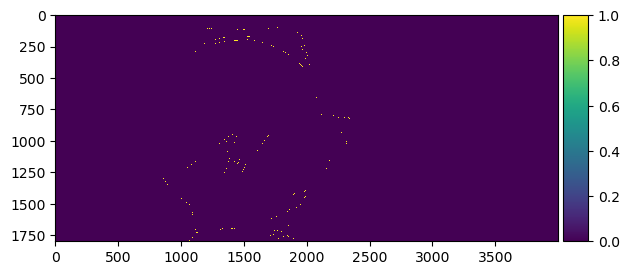

In [298]:
subtracted = np.subtract(hms, hm)

# Optional: Clip the result to avoid negative values (if needed)
subtracted_clipped = np.clip(subtracted, 0, 1)

# Display the result
ski.io.imshow(subtracted_clipped)


Pronadjeno je 2 pikova
-58.00 -71.00
53.00 708.00


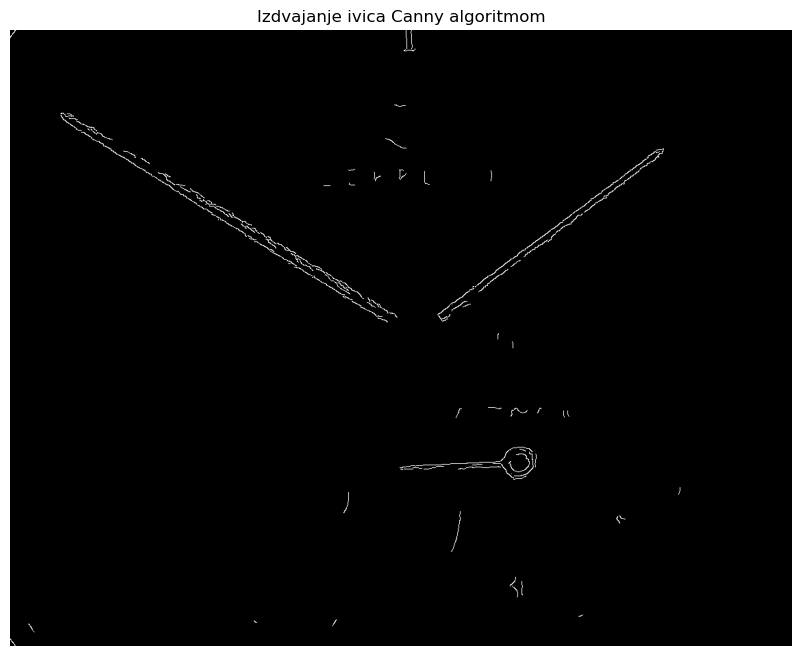

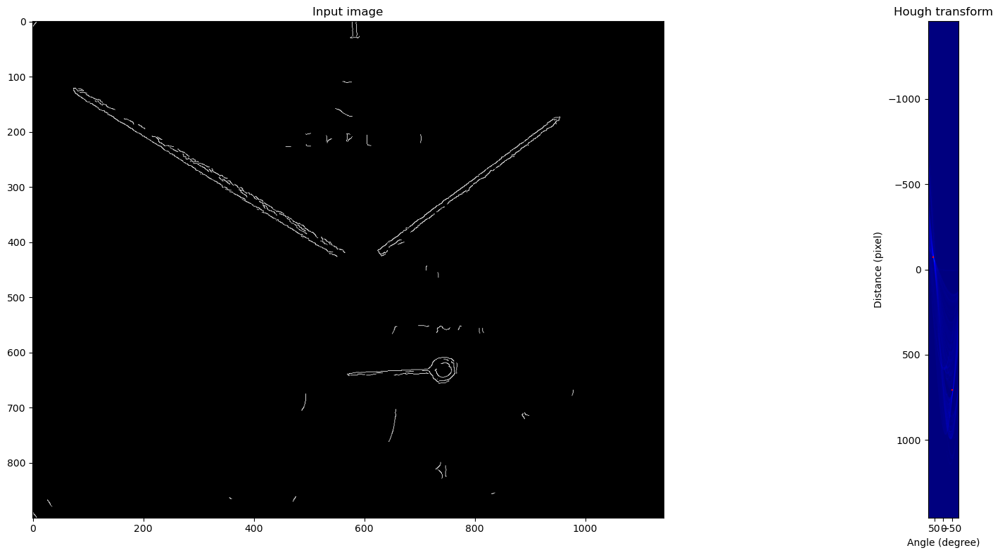

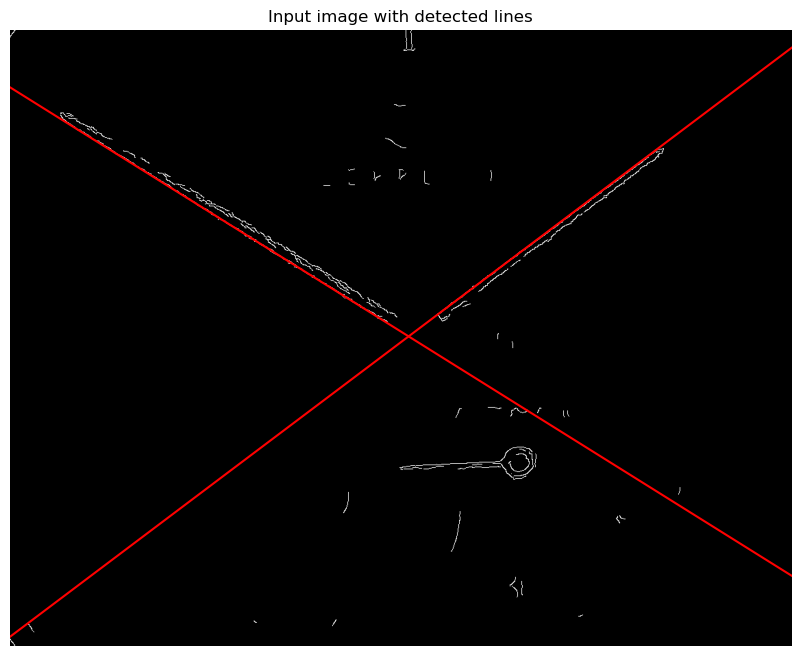

In [79]:

center_x = 2147  # Bonus 3 1450                           #  Bonus 2 1756
center_y = 888      #  888                                        881
N,M=np.shape(hms)
clock_canny_ticks = hm[center_y-N//4:center_y+N//4,center_x-M//7:center_x+M//7]

img_edges = clock_canny_ticks
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap='gray', vmin=0, vmax=1), axes.axis('off'), axes.set_title('Izdvajanje ivica Canny algoritmom')

tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 540, endpoint=False)
[out, angles, distances] = ski.transform.hough_line(img_edges, theta = tested_angles)
[intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=45, num_peaks=2)   # The intensity is the total number of votes for a particular line (angle-distance combination)# num_peaks=11 maksimalni broj pikova
fix, axes = plt.subplots(1, 2, figsize=(20, 8))

print('Pronadjeno je '+str(np.shape(peak_angles)[0])+' pikova')
for angle, dist in zip(peak_angles, peak_distances):
    "%5.4x"% (47)
    print('%.2f %.2f'% (np.rad2deg(angle), dist))


axes[0].imshow(img_edges, cmap=plt.cm.gray)
axes[0].set_title('Input image')
axes[1].imshow(
    out, cmap=plt.cm.jet,
    extent=(np.rad2deg(angles[-1]), np.rad2deg(angles[0]), distances[-1], distances[0]))     # extent xmax,xmin pa onda ymax,ymin
axes[1].set_title('Hough transform')
axes[1].set_xlabel('Angle (degree)')
axes[1].set_ylabel('Distance (pixel)')
axes[1].scatter(np.rad2deg(-peak_angles), peak_distances, s=2, c='r', marker='+')
plt.tight_layout()

# plot detected lines
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(img_edges, cmap=plt.cm.gray)
axes.set_title('Input image with detected lines')
origin = np.array((0, img_edges.shape[1]))
for _, angle, dist in zip(intensity, peak_angles, peak_distances):
    y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
    axes.plot(origin, (y0, y1), '-r')
axes.set_xlim(origin)
axes.set_ylim((img_edges.shape[0], 0))
axes.set_axis_off()










Duzina najduzeg segmenta: 399
Koordinate: (627, 414, 946, 174)
Duzina najduzeg segmenta 1: 544
Koordinate: (544, 423, 82, 134)


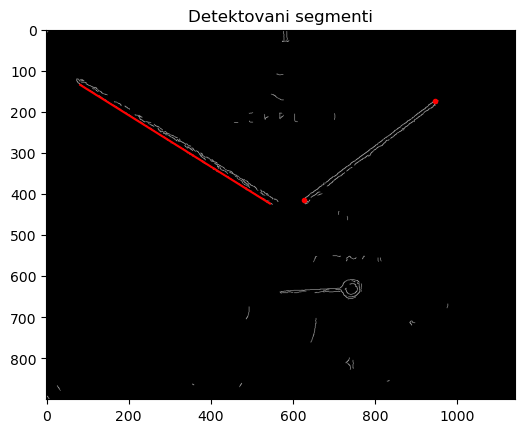

In [82]:
# Detekcija segmenata pomoću modifikovane funkcije get_line_segments_clock
img_edges = clock_canny_ticks 


# Parametri odredjeni prethodno u ćeliji iznad
thetas, rhos = np.deg2rad(-58), -71
theta, rho = np.deg2rad(53), 708
theta1, rho1 =np.deg2rad(-55.33), -135



min_length = 85
max_gap = 20
tolerancy = 10


longest_segment_coord, longest_segment_size = get_line_segments_clock(
    img_edges, (theta, rho), min_length, max_gap, tolerancy
)

longest_segment_coord_1, longest_segment_size_1 = get_line_segments_clock(
    img_edges, (thetas, rhos), min_length, max_gap, tolerancy
)

if longest_segment_coord:
    print(f"Duzina najduzeg segmenta: {longest_segment_size}")
    print(f"Koordinate: {longest_segment_coord}")
    print(f"Duzina najduzeg segmenta 1: {longest_segment_size_1}")
    print(f"Koordinate: {longest_segment_coord_1}")
    fig, ax = plt.subplots()
    ax.imshow(img_edges, cmap=plt.cm.gray)
    x1, y1, x2, y2 = longest_segment_coord
    x11, y11, x21, y21 = longest_segment_coord_1
    ax.plot((x1, x2), (y1, y2), '.r')   
    ax.plot((x11, x21), (y11, y21), '-r')
    ax.set_title('Detektovani segmenti')
    plt.show()
else:
    print("No valid segments detected.")

(array([2174]), array([888]), 700)


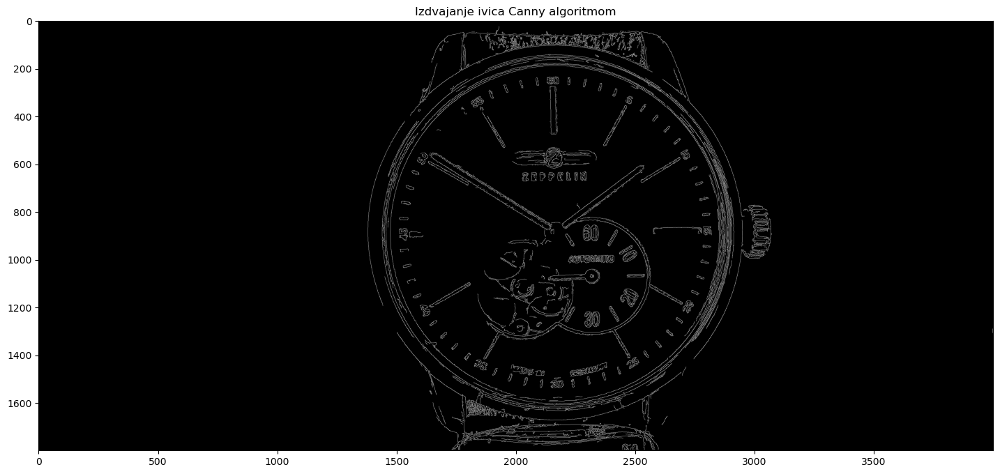

In [77]:
def get_circle_center_bonus(edges):
    
    hough_radii = np.arange(500, 2000, 100)
    hough_res = hough_circle(edges, hough_radii)

    # Select the most prominent 2 circles
    accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=1)
    if len(cx) > 0 and len(cy) > 0:
        radius = int(radii[0])
    else:
        radius = None
    return (cx,cy,radius)    
    

clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus7.jpg'))
clock = clock_png[:,:,0]
clock_center_canny = ski.feature.canny(clock,0.3,0.1,0.25) # Izdvajanje ivica za detekciju kruga i centra kruga
fix, axes = plt.subplots(1, 1, figsize=(20, 8))
axes.imshow(clock_center_canny, cmap='gray', vmin=0, vmax=1), axes.set_title('Izdvajanje ivica Canny algoritmom')

print(get_circle_center_bonus(clock_center_canny))


    

In [85]:
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
import numpy as np

def detect_prominent_circle(edges, radius_threshold):
    """
    Detect the most prominent circle with a radius smaller than the given threshold.
    
    Parameters:
        image (ndarray): Input grayscale image.
        radius_threshold (int): Maximum radius to consider for circle detection.
        sigma (float): Standard deviation for Canny edge detection.
        low_threshold (int): Lower threshold for Canny edge detection.
        high_threshold (int): Upper threshold for Canny edge detection.

    Returns:
        dict: A dictionary containing:
            - 'center': (y, x) coordinates of the circle center.
            - 'radius': Radius of the detected circle.
            - 'accumulator': Accumulator value for the detected circle.
            - 'circle_perimeter_coords': Coordinates of the circle's perimeter.
    """
   

    
    # Step 2: Define radii to consider
    radii = np.arange(200, radius_threshold, step=20)
    
    # Step 3: Perform Hough Transform for circles
    hough_res = hough_circle(edges, radii)
    
    # Step 4: Find peaks in the accumulator (most prominent circles)
    accumulators, cx, cy, radii_peaks = hough_circle_peaks(hough_res, radii, total_num_peaks=1)
    
    if len(cx) == 0:
        return None  # No circle found
    
    # Step 5: Return the most prominent circle
    y, x, r = cy[0], cx[0], radii_peaks[0]
    circle_coords = circle_perimeter(y, x, r)
    circle_coords = np.clip(circle_coords, 0, np.array(edges.shape)[:, None] - 1)  # Ensure coordinates are within bounds

    return {
        "center": (y, x),   
        "radius": r,
        "accumulator": accumulators[0],
        "circle_perimeter_coords": circle_coords
    }


In [187]:
circle=detect_prominent_circle(clock_center_canny, 500)
print(detect_prominent_circle(clock_center_canny, 500)["center"])

(1091, 1600)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


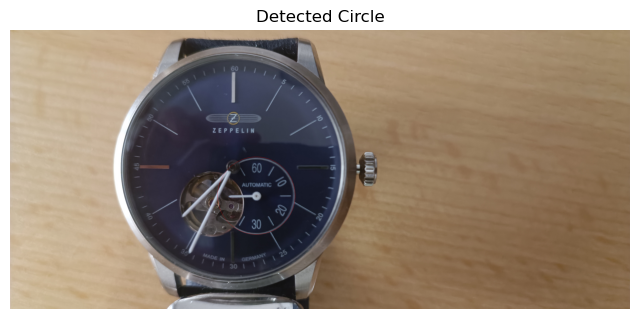

In [114]:
import matplotlib.pyplot as plt
from skimage.draw import circle_perimeter

def draw_detected_circle(image, detected_circle):
    """
    Draws the detected circle on the original image.

    Parameters:
        image (ndarray): The original image (RGB).
        detected_circle (dict): Output from detect_prominent_circle containing circle details.
    """
    if not detected_circle:
        print("No circle detected.")
        return

    # Extract circle properties
    y, x = detected_circle["center"]
    r = detected_circle["radius"]

    # Make a copy of the original image
    output_image = image.copy()

    # Draw the circle perimeter
    rr, cc = circle_perimeter(y, x, r)
    rr = np.clip(rr, 0, image.shape[0] - 1)  # Ensure coordinates are within bounds
    cc = np.clip(cc, 0, image.shape[1] - 1)  # Ensure coordinates are within bounds
    output_image[rr, cc] = [255, 0, 0]  # Color the circle in red

    # Display the image with the detected circle
    plt.figure(figsize=(8, 8))
    plt.imshow(output_image)
    plt.title("Detected Circle")
    plt.axis("off")
    plt.show()

# Example usage:
# Assuming `image` is your original RGB image and `detected_circle` contains the circle properties
draw_detected_circle(clock_png, circle)


In [101]:

def extract_time_bonus(img_in):
    
    
    clock = img_in[:,:,0]
    [N,M]=clock.shape
    clock_center_canny = ski.feature.canny(clock,0.3,0.1,0.25) # manje agresivno izdvajanje ivica zbog detekcije centra
    center_x, center_y = get_circle_center_bonus(clock_center_canny)[0][0],get_circle_center_bonus(clock_center_canny)[1][0]
    center_x_ss, center_y_ss = detect_prominent_circle(clock_center_canny, 500)["center"][1],detect_prominent_circle(clock_center_canny, 500)["center"][0]  
    # Vrsimo morfolosku operaciju erozije nad slikom radi izdvajanja samo bitnih informacija, što su kazaljke
    
    footprint = disk(7)
    eroded_clock = erosion(clock, footprint)

    # Spremamo dve slike ivica za Hough-ovu detekciju linija
    
    hms=ski.feature.canny(eroded_clock,0.2,0.2,0.4)  # jasno vidljive sve 3 kazaljke
    hm=ski.feature.canny(eroded_clock,0.2,0.3,0.5)  # jasno vidljive samo satna i minutna kazaljka
    # Posmatramo samo centralni deo na obe slike
    hm_edges = hm[center_y-N//4:center_y+N//4,center_x-M//7:center_x+M//7]
    hms_edges = hms[center_y-N//4:center_y+N//4,center_x-M//7:center_x+M//7]
    
    hm_angles = [] # uglovi satne i minutne kazaljke u odnosu na vertikalnu osu
    hm_length = []
    
    center_x_cropped, center_y_cropped = M//7, N//4   # koordinate centra na isečenoj slici
    
    # Detekcija pravaca satne i minutne kazalkje na slici hm_edges
    
    tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 540, endpoint=False)
    [out, angles, distances] = ski.transform.hough_line(hm_edges, theta = tested_angles)
    [intensity, peak_angles, peak_distances] = ski.transform.hough_line_peaks(out, angles, distances, threshold=45, num_peaks=2) 

    # Detekcija pravaca sve 3 kazaljke na slici hms_edges
    
    [out_s, angles_s, distances_s] = ski.transform.hough_line(hms_edges, theta = tested_angles)
    [intensity_s, peak_angles_s, peak_distances_s] = ski.transform.hough_line_peaks(out, angles, distances, threshold=45, num_peaks=3)  

    remaining_angles_s = [angle for angle in peak_angles_s if angle not in peak_angles]
    remaining_distances_s = [dist for dist in peak_distances_s if dist not in peak_distances]

    
    for i in range(0,np.shape(peak_angles)[0]):  # prolazimo kroz detektovane linije
        line=peak_angles[i], peak_distances[i]
        hands = get_line_segments_clock(hm_edges, line, 95, 50, 10)  # detekcija segmenata vecih od odredjene duine duz pravca zadatog sa line
        if get_distance((hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped)<get_distance((hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped):  
            hm_angles.append(get_angle((hands[0])[0],(hands[0])[1],(hands[0])[2],(hands[0])[3],center_x_cropped,center_y_cropped))
            hm_length.append(hands[1])

        # Provera da li je prvi par koordinata bliži centru radi pravilnog detektovanja ugla pomoću get_angle
        # Vektor kazaljke mora biti definisan od centra ka obodu sata
        else:
            hm_angles.append(get_angle((hands[0])[2],(hands[0])[3],(hands[0])[0],(hands[0])[1],center_x_cropped,center_y_cropped))
            hm_length.append(hands[1])
    print(hm_length)
    print(hm_angles)
    # Ako se kazaljke poklapaju
    if len(hm_angles)==1:
        hour_angle=minute_angle=hm_angles[0]
    # Odredjivanje minutne i satne kazaljke na osnovu dužine
    if hm_length[0]>hm_length[1]:
        hour_angle=hm_angles[1]
        minute_angle=hm_angles[0]
    else:
        hour_angle=hm_angles[0]
        minute_angle=hm_angles[1]
         
    
    center_x_s = center_x_ss - (center_x-M//7)
    center_y_s = center_y_ss - (center_y-N//4)
    print('Centar manjeg sata na crop slici:', center_x_s,',',center_y_s)
    # Detekcija sekundare
    line_s = remaining_angles_s[0], remaining_distances_s[0]
    hand_s = get_line_segments_clock(hms_edges,line_s,85,10,2)
    if get_distance((hand_s[0])[0],(hand_s[0])[1],center_x_s,center_y_s)<get_distance((hand_s[0])[2],(hand_s[0])[3],center_x_s,center_y_s):
        second_angle = get_angle((hand_s[0])[0],(hand_s[0])[1],(hand_s[0])[2],(hand_s[0])[3],center_x_s,center_y_s)
    else: 
        second_angle = get_angle((hand_s[0])[2],(hand_s[0])[3],(hand_s[0])[0],(hand_s[0])[1],center_x_s,center_y_s)

    return [hour_angle,minute_angle,second_angle]
        


In [131]:
# Lists for Hough transform with num_peaks=2
angles = [30, 45]  # Replace with your values
distances = [245, 234]  # Replace with your values

# Lists for Hough transform with num_peaks=3
angles_s = [30, 45, 43]  # Replace with your values
distances_s = [245, 234, 456]  # Replace with your values

# Exclude common angles and distances
remaining_angles_s = [angle for angle in angles_s if angle not in angles]
remaining_distances_s = [dist for dist in distances_s if dist not in distances]

# Outputs the remaining angle and distance
print("Remaining Angle:", remaining_angles_s[0])
print("Remaining Distance:", remaining_distances_s[0])


Remaining Angle: 43
Remaining Distance: 456


In [90]:
# Testiranje extract_time_bonus
clock_png = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus2.jpg'))
print(extract_time_bonus(clock_png))

[-0.9628399706835384]
[-132.0]
[424, 185]
[213.952203250299, 74.98892242200867]
Centar manjeg sata na crop slici: 712 , 655
[74.98892242200867, 213.952203250299, 124.92566726989725]


In [91]:
# Testiranje extract_time_bonus
clock_png_7 = ski.util.img_as_float(ski.io.imread('image_sequences/clocksBonus/bonus7.jpg'))
print(extract_time_bonus(clock_png_7))

[1.5184364492350668]
[665.0]
[544, 403]
[302.02767294806506, 52.95966424653509]
Centar manjeg sata na crop slici: 712 , 637
[52.95966424653509, 302.02767294806506, 267.05355261998767]
